In [1]:
import rapids_singlecell as rsc

## **Import Packages for GPU-based**

In [2]:
import scanpy as sc 
import pandas as pd
import seaborn as sns
import numpy as np
from scipy.stats import median_abs_deviation
import os
import warnings
warnings.filterwarnings('ignore', 'Expected')
warnings.simplefilter('ignore')

import anndata 
from anndata import AnnData
import matplotlib

import time
import cuda
import cudf
import cupy

from cuml.decomposition import PCA
from cuml.manifold import TSNE
from cuml.cluster import KMeans
from cuml.preprocessing import StandardScaler



In [3]:
import tensorflow as tf

print(tf.config.list_physical_devices('GPU'))

2024-04-23 10:42:21.524935: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-23 10:42:28.372765: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-23 10:42:28.372825: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-23 10:42:29.093590: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-23 10:42:30.576773: I tensorflow/core/platform/cpu_feature_guar

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:3', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:4', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:5', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:6', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:7', device_type='GPU')]


In [4]:
import rmm
from rmm.allocators.cupy import rmm_cupy_allocator

rmm.reinitialize(
    managed_memory=True,
)

cupy.cuda.set_allocator(rmm_cupy_allocator)

In [5]:
print(sc.__dir__())

['__name__', '__doc__', '__package__', '__loader__', '__spec__', '__path__', '__file__', '__cached__', '__builtins__', '_version', '__version__', 'logging', '_settings', '_utils', '_compat', 'settings', 'Verbosity', 'get', 'neighbors', 'preprocessing', 'readwrite', 'tools', 'tl', 'pp', 'plotting', 'pl', 'datasets', 'queries', 'external', 'metrics', 'experimental', 'AnnData', 'concat', 'read_h5ad', 'read_csv', 'read_excel', 'read_hdf', 'read_loom', 'read_mtx', 'read_text', 'read_umi_tools', 'read', 'read_10x_h5', 'read_10x_mtx', 'write', 'read_visium', 'Neighbors', 'set_figure_params']


In [6]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

scanpy==1.9.8 anndata==0.10.6 umap==0.5.5 numpy==1.24.4 scipy==1.12.0 pandas==1.5.3 scikit-learn==1.4.1.post1 statsmodels==0.14.1 pynndescent==0.5.11


In [7]:
results_file = "/home/supakorn/rscript/results/GSE178146/GSE178146_test_removedbg.h5ad"

In [8]:
directory = '/home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/'
dirs = os.listdir(directory)
print(dirs)

['C34_raw_matrix_denoised_metrics.csv', 'C87_raw_matrix_denoised_cell_barcodes.csv', 'C36_raw_matrix_denoised_filtered.h5', 'DLB566_raw_matrix_denoised.log', 'PD666_raw_matrix_denoised_cell_barcodes.csv', 'DLB115_raw_matrix_denoised_filtered.h5', 'PD416_raw_matrix_denoised.h5', 'C34_raw_matrix_denoised_filtered.h5', 'PDD501_raw_matrix_denoised.h5', 'PD413_raw_matrix_denoised.log', 'PDD366_raw_matrix_denoised_cell_barcodes.csv', 'PDD341_raw_matrix_denoised.h5', 'DLB332_raw_matrix_denoised.log', 'PDD341_raw_matrix_denoised.pdf', 'DLB332_raw_matrix_denoised.h5', 'DLB332_raw_matrix_denoised.h_posterior.h5', 'PD666_raw_matrix_denoised_filtered.h5', 'DLB332_raw_matrix_denoised.pdf', 'PDD531_raw_matrix_denoised_filtered.h5', 'DLB706_raw_matrix_denoised.log', 'PDD678_raw_matrix_denoised.h5', 'PDD415_raw_matrix_denoised_metrics.csv', 'C22_raw_matrix_denoised.h5', 'C36_raw_matrix_denoised.log', 'PDD341_raw_matrix_denoised_cell_barcodes.csv', 'DLB566_raw_matrix_denoised.h_posterior.h5', 'PDD501_r

In [9]:
list(dirs)

['C34_raw_matrix_denoised_metrics.csv',
 'C87_raw_matrix_denoised_cell_barcodes.csv',
 'C36_raw_matrix_denoised_filtered.h5',
 'DLB566_raw_matrix_denoised.log',
 'PD666_raw_matrix_denoised_cell_barcodes.csv',
 'DLB115_raw_matrix_denoised_filtered.h5',
 'PD416_raw_matrix_denoised.h5',
 'C34_raw_matrix_denoised_filtered.h5',
 'PDD501_raw_matrix_denoised.h5',
 'PD413_raw_matrix_denoised.log',
 'PDD366_raw_matrix_denoised_cell_barcodes.csv',
 'PDD341_raw_matrix_denoised.h5',
 'DLB332_raw_matrix_denoised.log',
 'PDD341_raw_matrix_denoised.pdf',
 'DLB332_raw_matrix_denoised.h5',
 'DLB332_raw_matrix_denoised.h_posterior.h5',
 'PD666_raw_matrix_denoised_filtered.h5',
 'DLB332_raw_matrix_denoised.pdf',
 'PDD531_raw_matrix_denoised_filtered.h5',
 'DLB706_raw_matrix_denoised.log',
 'PDD678_raw_matrix_denoised.h5',
 'PDD415_raw_matrix_denoised_metrics.csv',
 'C22_raw_matrix_denoised.h5',
 'C36_raw_matrix_denoised.log',
 'PDD341_raw_matrix_denoised_cell_barcodes.csv',
 'DLB566_raw_matrix_denoised.h

In [10]:
metric = []

for file in [x for x in dirs if x.endswith('metrics.csv')]:
    
    metric_df = pd.read_csv(directory + file, header = None, names = ['Metric', 'Value']).set_index('Metric').T
    
    metric_df['File'] = file
    metric.append(metric_df)
    
metric = pd.concat(metric).reset_index()

In [11]:
metric

Metric,index,total_raw_counts,total_output_counts,total_counts_removed,fraction_counts_removed,total_raw_counts_in_cells,total_counts_removed_from_cells,fraction_counts_removed_from_cells,average_counts_removed_per_cell,target_fpr,expected_cells,found_cells,output_average_counts_per_cell,ratio_of_found_cells_to_expected_cells,found_empties,fraction_of_analyzed_droplets_that_are_nonempty,convergence_indicator,overall_change_in_train_elbo,File
0,Value,50288620.0,48720200.0,1568420.0,0.031,50288628.0,1568428.0,0.031,161.311,0.01,4302.0,9723.0,5010.820,2.260,20277.0,0.324,0.955,1594.747,C34_raw_matrix_denoised_metrics.csv
1,Value,23940950.0,22307235.0,1633715.0,0.068,23940952.0,1633717.0,0.068,181.544,0.01,3469.0,8999.0,2478.857,2.594,21001.0,0.300,0.467,652.622,PDD415_raw_matrix_denoised_metrics.csv
2,Value,11286424.0,9743807.0,1542617.0,0.137,11286424.0,1542617.0,0.137,143.286,0.01,4281.0,10766.0,905.054,2.515,19234.0,0.359,0.404,275.589,PDD501_raw_matrix_denoised_metrics.csv
3,Value,28985118.0,27516280.0,1468838.0,0.051,28985120.0,1468840.0,0.051,155.829,0.01,4232.0,9426.0,2919.189,2.227,20574.0,0.314,1.295,910.982,DLB706_raw_matrix_denoised_metrics.csv
4,Value,40059940.0,38749744.0,1310196.0,0.033,40059944.0,1310200.0,0.033,150.893,0.01,3636.0,8683.0,4462.714,2.388,21317.0,0.289,0.693,1191.546,PD413_raw_matrix_denoised_metrics.csv
5,Value,17405884.0,16310475.0,1095409.0,0.063,17405884.0,1095409.0,0.063,128.690,0.01,3225.0,8512.0,1916.174,2.639,21488.0,0.284,0.833,445.472,PDD366_raw_matrix_denoised_metrics.csv
6,Value,50941396.0,49209968.0,1731428.0,0.034,50941384.0,1731416.0,0.034,165.480,0.01,4619.0,10463.0,4703.237,2.265,19537.0,0.349,0.778,1480.031,PDD563_raw_matrix_denoised_metrics.csv
7,Value,24257510.0,22038348.0,2219162.0,0.091,24257510.0,2219162.0,0.091,182.527,0.01,4238.0,12158.0,1812.662,2.869,17842.0,0.405,0.638,613.867,DLB163_raw_matrix_denoised_metrics.csv
8,Value,54763356.0,52846621.0,1916735.0,0.035,54763368.0,1916747.0,0.035,208.682,0.01,3683.0,9185.0,5753.579,2.494,20815.0,0.306,1.265,1566.052,PD747_raw_matrix_denoised_metrics.csv
9,Value,18165868.0,16807988.0,1357880.0,0.075,18165866.0,1357878.0,0.075,127.512,0.01,4332.0,10649.0,1578.363,2.458,19351.0,0.355,0.316,504.721,PDD531_raw_matrix_denoised_metrics.csv


array([[<Axes: title={'center': 'fraction_counts_removed'}>]],
      dtype=object)

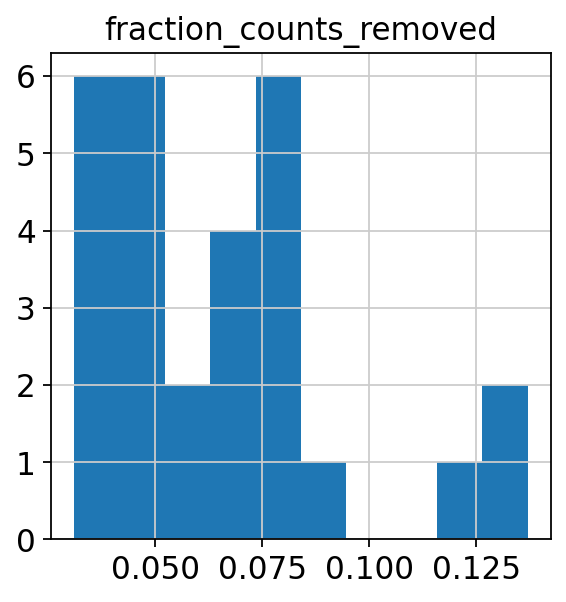

In [12]:
metric.hist('fraction_counts_removed')

### **Remove Noise BackGround and Create AnnData object**

In [13]:
list_adata = [x for x in dirs if x.endswith('filtered.h5')]

In [14]:
list_adata

['C36_raw_matrix_denoised_filtered.h5',
 'DLB115_raw_matrix_denoised_filtered.h5',
 'C34_raw_matrix_denoised_filtered.h5',
 'PD666_raw_matrix_denoised_filtered.h5',
 'PDD531_raw_matrix_denoised_filtered.h5',
 'PDD341_raw_matrix_denoised_filtered.h5',
 'PD732_raw_matrix_denoised_filtered.h5',
 'PD523_raw_matrix_denoised_filtered.h5',
 'PD683_raw_matrix_denoised_filtered.h5',
 'PD413_raw_matrix_denoised_filtered.h5',
 'DLB163_raw_matrix_denoised_filtered.h5',
 'PDD366_raw_matrix_denoised_filtered.h5',
 'PDD415_raw_matrix_denoised_filtered.h5',
 'PDD678_raw_matrix_denoised_filtered.h5',
 'PDD501_raw_matrix_denoised_filtered.h5',
 'PDD563_raw_matrix_denoised_filtered.h5',
 'C22_raw_matrix_denoised_filtered.h5',
 'DLB294_raw_matrix_denoised_filtered.h5',
 'DLB060_raw_matrix_denoised_filtered.h5',
 'PD747_raw_matrix_denoised_filtered.h5',
 'DLB332_raw_matrix_denoised_filtered.h5',
 'C87_raw_matrix_denoised_filtered.h5',
 'C05_raw_matrix_denoised_filtered.h5',
 'C91_raw_matrix_denoised_filter

In [15]:
dfs = []
patient_adata_list = []

for filename in list_adata:
    
    # Replace suffix name and split file's name 
    name = filename.replace('_raw_matrix_denoised_filtered.h5', '').split('_')
    patient = name[0]
    
    
    #matrix_file = os.path.join(dirs, filename)
    
    
    # Make adata metadata
    adata = sc.read_10x_h5(directory + filename)
    adata.var_names_make_unique()
    #adata.write_h5ad('/home/supakorn/rscript/dataset/GSE178146/GSE178146h5ad/' + patient + '_raw_matrix' + '.h5ad')
    
    
    # Append metadata in patient_adata_list
    patient_adata_list.append(adata)
    adata.obs['Patient'] = patient
    
    
    # Create Adata DataFrame and append 
    df = pd.DataFrame(adata.obs)
    dfs.append(df)

# Merge DataFrame
merge_df = pd.concat(dfs)



reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/C36_raw_matrix_denoised_filtered.h5
 (0:00:01)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/DLB115_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/C34_raw_matrix_denoised_filtered.h5
 (0:00:01)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/PD666_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/PDD531_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/PDD341_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/PD732_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/PD523_raw_matrix_denoised_filtered.h5
 (0:00:00)
reading /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremov

In [16]:
#select GPU environment *****

#os.environ['CUDA_VISIBLE_DEVICES'] = '1,2'

In [17]:
#%%sh
#cd ../dataset/GSE178146/GSE178146h5ad
#for file in *h5ad; do cellbender remove-background --input $file --output /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/$(basename $file .h5ad)_denoised.h5ad  --total-droplets-included 50000 --cuda --checkpoint /home/supakorn/rscript/dataset/GSE178146/GSE178146bgremoved/$(basename $file .h5ad).ckpt.tar.gz ; done

In [18]:
# Concatenate adata list of patient_adata_list
merged_adata = anndata.concat(patient_adata_list, join='outer', merge='same')

In [19]:
merged_adata

AnnData object with n_obs × n_vars = 279488 × 33538
    obs: 'Patient'
    var: 'gene_ids', 'feature_types', 'genome'

In [20]:
merge_df

,Patient
GCGCCAATCTTGCAAG-1,C36
CCTTTCTAGATACACA-1,C36
AAGGAGCTCGTACGGC-1,C36
ACACCAAAGCTAAACA-1,C36
GATCGCGCAGCCTTTC-1,C36
...,...
TGCACCTGTTCGGGCT-1,PD416
CGCCAAGCAGGGCATA-1,PD416
GTTACAGGTCAAAGCG-1,PD416
CTCAGAATCCAGAGGA-1,PD416


In [21]:
def categorize_patient(patient):
    if patient.startswith('C'):
        return 'CTL'
    elif patient.startswith('PD'):
        if patient.startswith('PDD'):
            return 'PDD'
        else: 
            return 'PD'
    elif patient.startswith('DLB'):
        return 'DLB'
    else:
        return 'Unknown'

In [22]:
merged_adata.obs['Conditions'] = merged_adata.obs['Patient'].apply(categorize_patient)

In [23]:
merged_adata.obs['Conditions'].unique()

array(['CTL', 'DLB', 'PD', 'PDD'], dtype=object)

In [24]:
merged_adata

AnnData object with n_obs × n_vars = 279488 × 33538
    obs: 'Patient', 'Conditions'
    var: 'gene_ids', 'feature_types', 'genome'

In [25]:
print(merged_adata.obs.value_counts())
print(merged_adata.obs.Patient)

Patient  Conditions
C05      CTL           14965
C22      CTL           14258
C48      CTL           12620
DLB163   DLB           12158
PD683    PD            11878
C91      CTL           11641
C36      CTL           10969
PD666    PD            10875
PDD501   PDD           10766
PDD531   PDD           10649
PDD563   PDD           10463
DLB115   DLB           10301
PDD341   PDD           10177
C34      CTL            9723
DLB706   DLB            9426
PD747    PD             9185
DLB566   DLB            9185
PDD415   PDD            8999
PD416    PD             8836
PD413    PD             8683
PDD366   PDD            8512
PD523    PD             8269
C87      CTL            8206
PDD678   PDD            8205
DLB332   DLB            8046
DLB060   DLB            8014
PD732    PD             7639
DLB294   DLB            6840
dtype: int64
GCGCCAATCTTGCAAG-1      C36
CCTTTCTAGATACACA-1      C36
AAGGAGCTCGTACGGC-1      C36
ACACCAAAGCTAAACA-1      C36
GATCGCGCAGCCTTTC-1      C36
               

In [26]:
merged_adata.X

<279488x33538 sparse matrix of type '<class 'numpy.float64'>'
	with 353761349 stored elements in Compressed Sparse Row format>

In [27]:
#AnnData.write(filename="/home/supakorn/rscript/GSE184950/GSE184950_dataset.h5ad", merged_adata=merged_adata)

In [28]:
rsc.get.anndata_to_GPU(merged_adata) ## Move adata.X to GPU
#rsc.get.anndata_to_CPU(merged_adata) ## Move adata.X to CPU

## **Quality Control and Filtering**

In [29]:
#merged_adata.var["mt"] = merged_adata.var_names.str.startswith("MT-")

rsc.pp.flag_gene_family(merged_adata, gene_family_name="mt", gene_family_prefix="MT-")

rsc.pp.calculate_qc_metrics(
    merged_adata, 
    qc_vars=["mt"], 
    log1p=True,
    #percent_top=[20],
    #inplace=True
    )

In [30]:
merged_adata

AnnData object with n_obs × n_vars = 279488 × 33538
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

### **Plot QC**

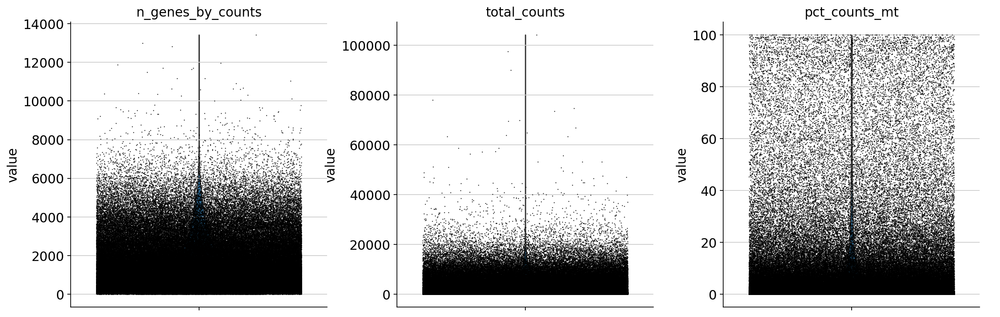

In [31]:
sc.pl.violin(
    merged_adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True)

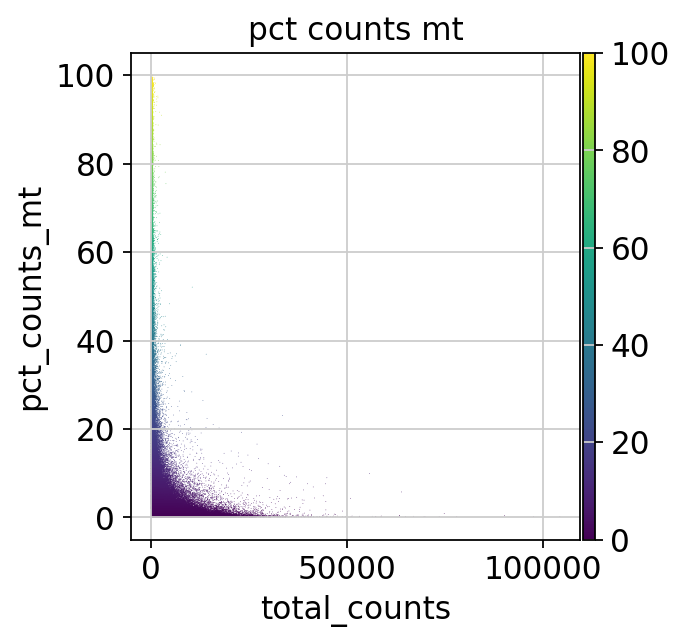

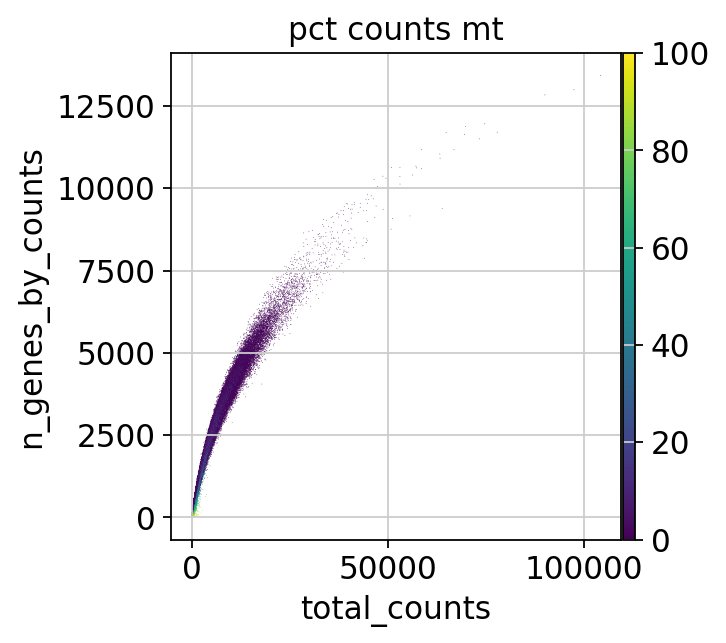

In [32]:
sc.pl.scatter(merged_adata, x="total_counts", y="pct_counts_mt", color="pct_counts_mt")
sc.pl.scatter(merged_adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt")

### **Outlier Threshold**

#### ***MAD = median(|Xi - median(X)|)***
Xi is the respective QC metric of an observation and 
describes a robust statistic of the variability of the metric.
[Germain et al., 2020]

In [33]:
#def is_outlier(merged_adata, metric: str, nmads: int):
#    M = merged_adata.obs[metric]
#    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
#        np.median(M) + nmads * median_abs_deviation(M) < M
#    )
#    return outlier

In [34]:
#merged_adata.obs["outlier"] = (
#    is_outlier(merged_adata, "log1p_total_counts", 5) |
#    is_outlier(merged_adata, "log1p_n_genes_by_counts", 5) #|
#    #is_outlier(merged_adata, "pct_counts_in_top_20_genes", 5)    
#)
#merged_adata.obs.outlier.value_counts()

In [35]:
#merged_adata.obs["mt_outlier"] = is_outlier(merged_adata, "pct_counts_mt", 3) | (
#    merged_adata.obs["pct_counts_mt"] > 20
#)
#merged_adata.obs.mt_outlier.value_counts()

In [36]:
#print(f"Total number of cells: {merged_adata.n_obs}")
#merged_adata = merged_adata[(~merged_adata.obs.outlier) & (~merged_adata.obs.mt_outlier)].copy()
#
#print(f"Number of cells after filtering of low quality cells: {merged_adata.n_obs}")

In [37]:
#sc.pl.scatter(merged_adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt")

### **Filtering**

In [38]:
merged_adata

AnnData object with n_obs × n_vars = 279488 × 33538
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

In [39]:
#print(f"Total number of genes: {merged_adata.n_vars}")
#rsc.pp.filter_cells(merged_adata, min_count=3)
#rsc.pp.filter_cells(merged_adata, max_count=20000)
#print(f"Number of genes after cell filter: {merged_adata.n_vars}")


merged_adata = merged_adata[merged_adata.obs.pct_counts_mt < 10, :]
merged_adata = merged_adata[merged_adata.obs.n_genes_by_counts < 6000, :]
merged_adata = merged_adata[merged_adata.obs.n_genes_by_counts > 200, :]
merged_adata = merged_adata[merged_adata.obs.total_counts < 40000, :]

In [40]:
rsc.pp.filter_genes(merged_adata, min_count=3)

filtered out 4128 genes based on n_cells_by_counts


In [41]:
merged_adata

AnnData object with n_obs × n_vars = 213478 × 29410
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

### **Plot after filtering**

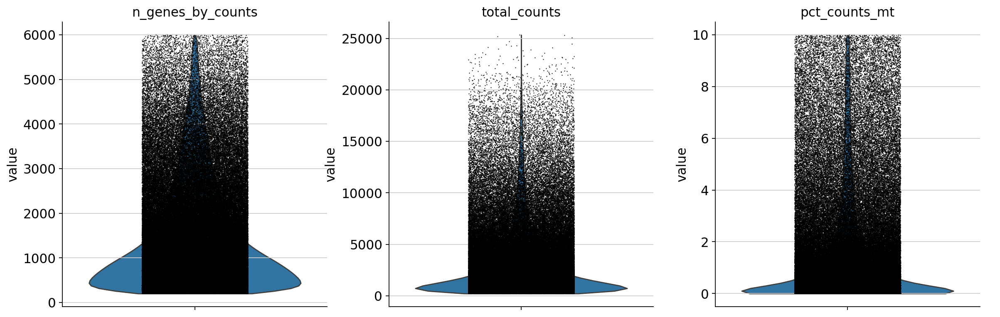

In [42]:
sc.pl.violin(
    merged_adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.2,
    multi_panel=True)

In [43]:
merged_adata.layers["counts"] = merged_adata.X.copy()
merged_adata.shape

(213478, 29410)

## **Normalization**

In [44]:
rsc.pp.normalize_total(merged_adata, target_sum=1e4)

In [45]:
rsc.pp.log1p(merged_adata)

In [46]:
rsc.pp.highly_variable_genes(merged_adata, n_top_genes=5000, flavor="seurat_v3", layer = "counts")


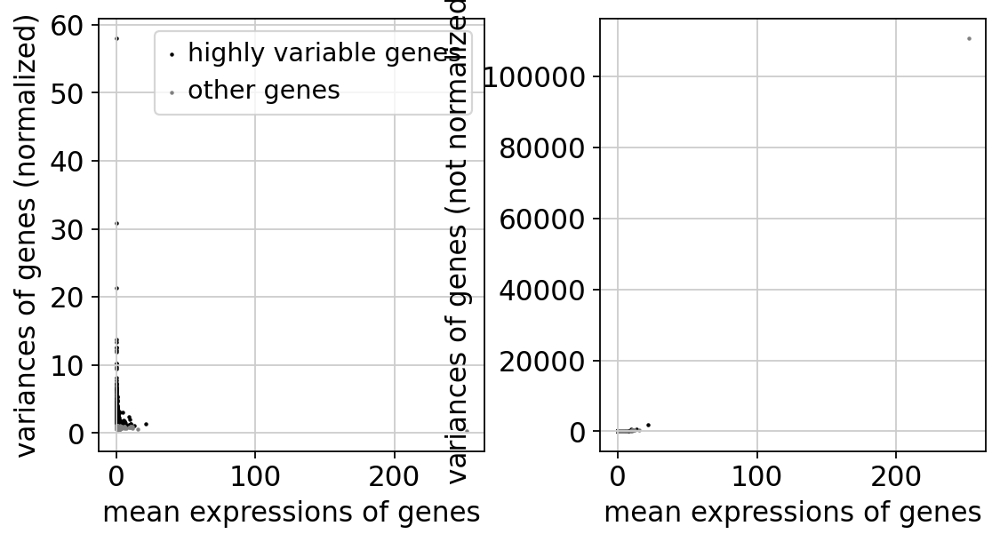

In [47]:
sc.pl.highly_variable_genes(merged_adata)

### Create .raw file

In [48]:
merged_adata.raw = merged_adata

In [49]:
merged_adata = merged_adata[:, merged_adata.var.highly_variable]

## **Regress out unwanted variable**

In [50]:
rsc.pp.regress_out(merged_adata, keys=["pct_counts_mt"])

## **Scale Data**

In [51]:
rsc.pp.scale(merged_adata, max_value=10)

## **Plot PCA**

In [52]:
rsc.pp.pca(merged_adata, n_comps=100)

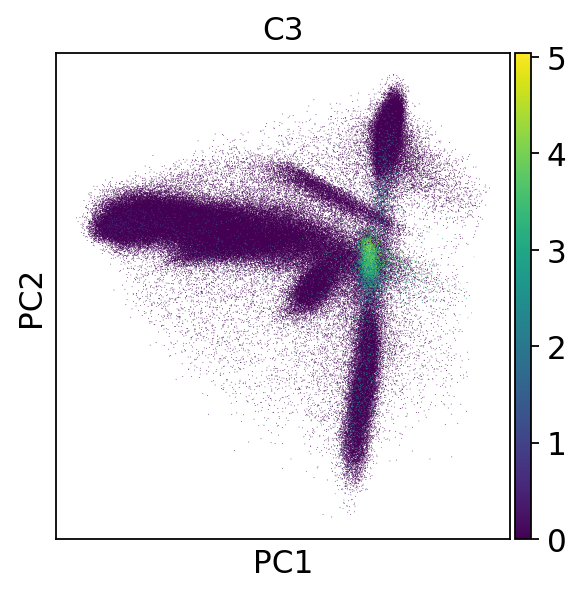

In [53]:
sc.pl.pca(merged_adata, color="C3")

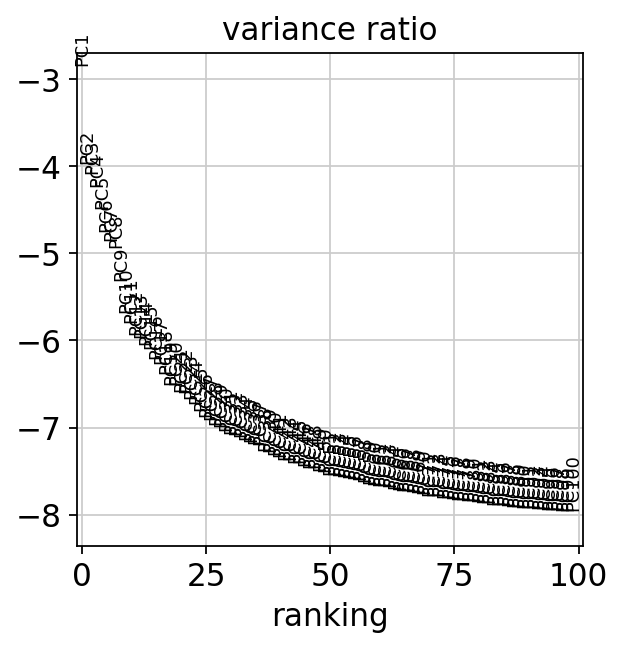

In [54]:
sc.pl.pca_variance_ratio(merged_adata, log=True, n_pcs=100)

In [55]:
rsc.get.anndata_to_CPU(merged_adata, convert_all=True)

In [56]:
merged_adata.write(results_file)

### **Batch Correction**

In [57]:
rsc.pp.harmony_integrate(merged_adata, key="Patient")

2024-04-23 10:47:33,127 - harmonypy_gpu - INFO - Iteration 1 of 10
2024-04-23 10:47:53,128 - harmonypy_gpu - INFO - Iteration 2 of 10
2024-04-23 10:48:10,117 - harmonypy_gpu - INFO - Iteration 3 of 10
2024-04-23 10:48:26,459 - harmonypy_gpu - INFO - Iteration 4 of 10
2024-04-23 10:48:43,076 - harmonypy_gpu - INFO - Iteration 5 of 10
2024-04-23 10:48:55,991 - harmonypy_gpu - INFO - Converged after 5 iterations


## **Find Neighbors**

In [58]:
rsc.pp.neighbors(merged_adata, n_neighbors=15, n_pcs=30)

In [59]:
rsc.tl.umap(merged_adata)
rsc.tl.tsne(merged_adata, perplexity=5, learning_rate=200)


## **Clustering and Visualization**

In [60]:
rsc.tl.leiden(merged_adata, resolution=0.3)
rsc.tl.louvain(merged_adata, resolution=0.3)

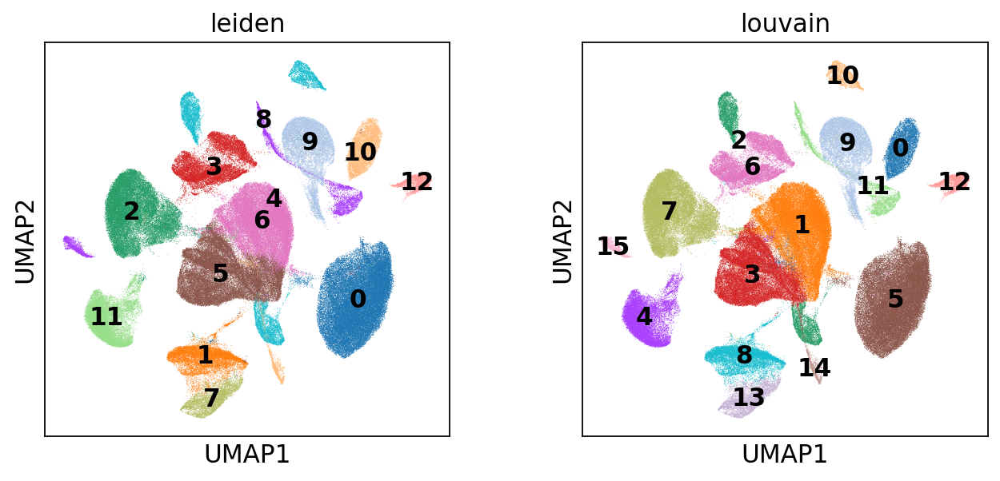

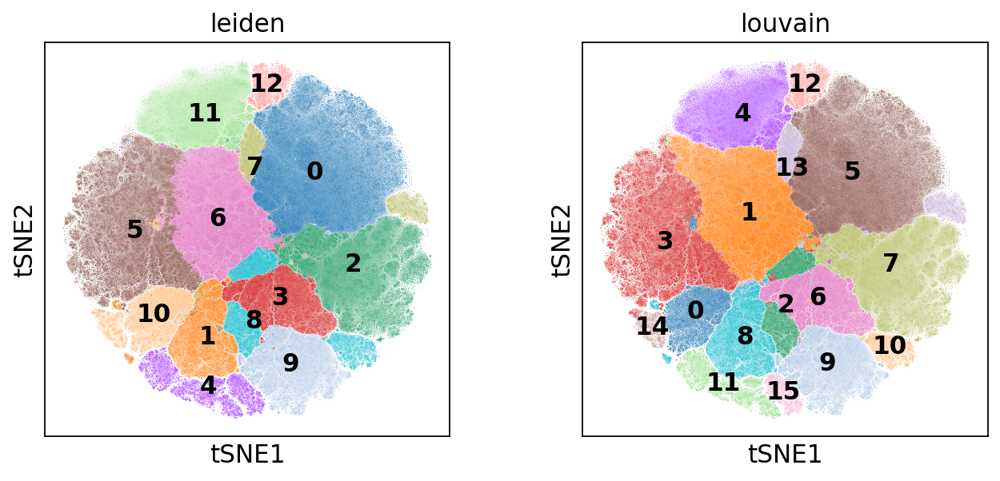

In [61]:
sc.pl.umap(merged_adata, color=["leiden", "louvain"], legend_loc="on data")
sc.pl.tsne(merged_adata, color=["leiden", "louvain"], legend_loc="on data")

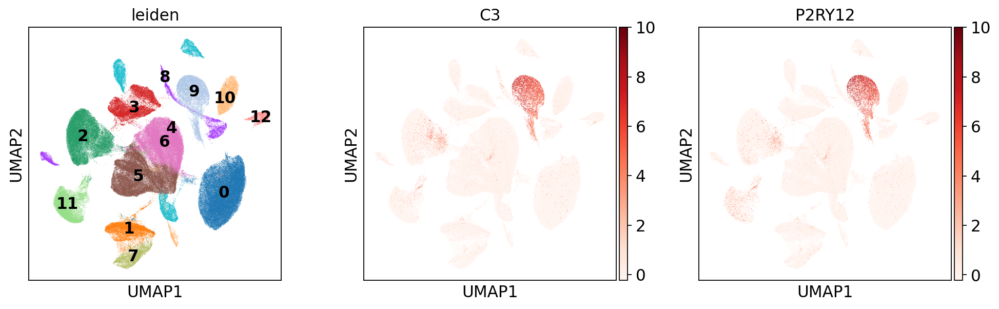

In [62]:
sc.pl.umap(merged_adata, color=["leiden", "C3", "P2RY12"], legend_loc="on data", use_raw=False, color_map='Reds')

In [63]:
merged_adata.write(results_file)

### UMAP and TSNE with Kmeans

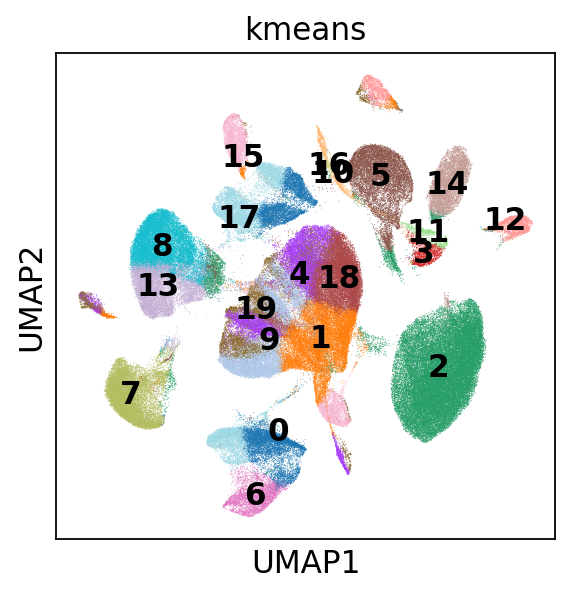

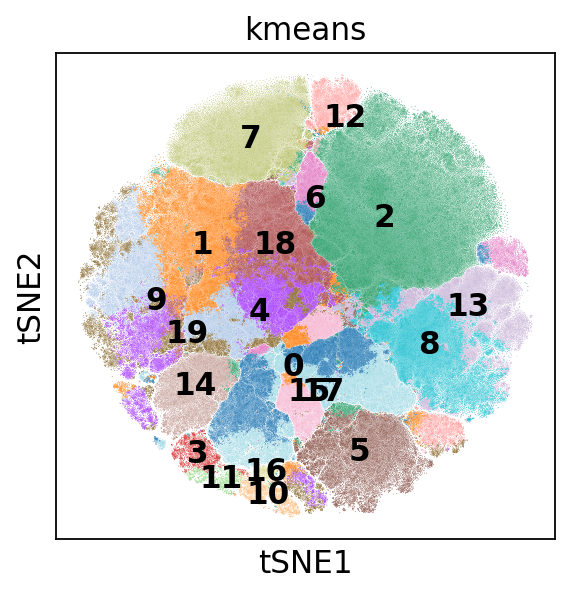

In [64]:
rsc.tl.kmeans(merged_adata, n_clusters=20)

sc.pl.umap(merged_adata, color=["kmeans"], legend_loc = 'on data')
sc.pl.tsne(merged_adata, color=["kmeans"], legend_loc = 'on data')

### Embedding density in the UMAP

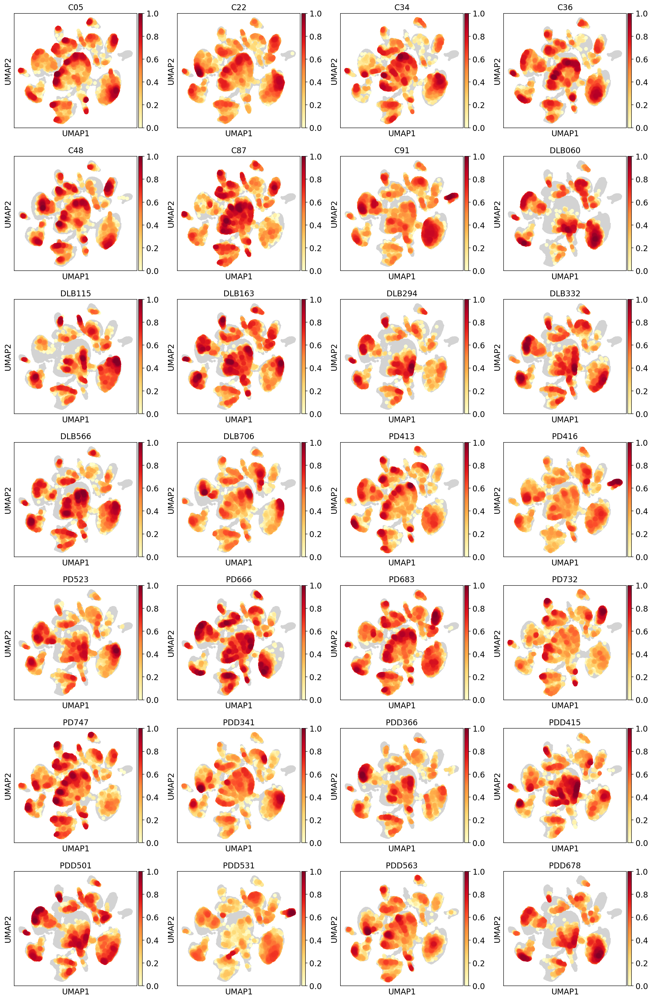

In [65]:
rsc.tl.embedding_density(merged_adata, groupby="Patient")
sc.pl.embedding_density(merged_adata, groupby="Patient")

## **Find Marker**

In [66]:
import decoupler as dc

In [67]:
markers = dc.get_resource('PanglaoDB')
markers

,genesymbol,canonical_marker,cell_type,germ_layer,human,human_sensitivity,human_specificity,mouse,mouse_sensitivity,mouse_specificity,ncbi_tax_id,organ,ubiquitiousness
0,CTRB1,False,Enterocytes,Endoderm,True,0.000000,0.004394,True,0.003311,0.020480,9606,GI tract,0.017
1,CTRB1,True,Acinar cells,Endoderm,True,1.000000,0.000629,True,0.957143,0.015920,9606,Pancreas,0.017
2,KLK1,True,Endothelial cells,Mesoderm,True,0.000000,0.008420,True,0.000000,0.014915,9606,Vasculature,0.013
3,KLK1,False,Goblet cells,Endoderm,True,0.588235,0.005039,True,0.903226,0.012408,9606,GI tract,0.013
4,KLK1,False,Epithelial cells,Mesoderm,True,0.000000,0.008233,True,0.225806,0.013758,9606,Epithelium,0.013
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8456,SLC14A1,True,Urothelial cells,Mesoderm,True,0.000000,0.018170,True,0.000000,0.000000,9606,Urinary bladder,0.008
8457,UPK3A,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8458,UPK1A,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8459,UPK2,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000


In [251]:
# Filter by canonical_marker and human
markers = markers[markers['human'] & 
                  markers['canonical_marker'] & 
                  (markers['organ'] == 'Brain') &
                  (markers['human_sensitivity'] > 0.5)]

# Remove duplicated entries
markers = markers[~markers.duplicated(['cell_type', 'genesymbol'])]
markers

,genesymbol,canonical_marker,cell_type,germ_layer,human,human_sensitivity,human_specificity,mouse,mouse_sensitivity,mouse_specificity,ncbi_tax_id,organ,ubiquitiousness
293,AGT,True,Astrocytes,Ectoderm,True,0.833333,0.014438,True,0.622951,0.009424,9606,Brain,0.020
478,DDC,True,Serotonergic neurons,Ectoderm,True,1.000000,0.004387,True,1.000000,0.016555,9606,Brain,0.014
751,FEV,True,Serotonergic neurons,Ectoderm,True,1.000000,0.003134,True,1.000000,0.003401,9606,Brain,0.003
961,S100B,True,Astrocytes,Ectoderm,True,1.000000,0.031387,True,0.000000,0.000000,9606,Brain,0.066
964,SLC1A2,True,Astrocytes,Ectoderm,True,1.000000,0.008788,True,0.000000,0.000000,9606,Brain,0.071
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7508,PEX5L,True,Oligodendrocytes,Ectoderm,True,0.750000,0.002212,True,0.608579,0.007076,9606,Brain,0.030
7517,ST18,True,Oligodendrocytes,Ectoderm,True,1.000000,0.001264,True,0.000000,0.000000,9606,Brain,0.006
7522,MAG,True,Oligodendrocytes,Ectoderm,True,1.000000,0.002212,True,0.989276,0.006604,9606,Brain,0.045
7530,PLP1,True,Oligodendrocytes,Ectoderm,True,1.000000,0.021808,True,1.000000,0.103174,9606,Brain,0.123


In [69]:
dc.run_ora(
    mat=merged_adata,
    net=markers,
    source='cell_type',
    target='genesymbol',
    min_n=3,
    verbose=True,
    use_raw=False
)

Running ora on mat with 213478 samples and 5000 targets for 26 sources.


100%|██████████| 213478/213478 [03:32<00:00, 1002.74it/s]


In [70]:
merged_adata.obsm['ora_estimate'].shape

(213478, 26)

In [71]:
acts = dc.get_acts(merged_adata, obsm_key='ora_estimate')

acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e
acts

AnnData object with n_obs × n_vars = 213478 × 26
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'leiden', 'louvain', 'kmeans', 'umap_density_Patient'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'tsne', 'leiden', 'louvain', 'leiden_colors', 'louvain_colors', 'kmeans_colors', 'umap_density_Patient_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'X_tsne', 'ora_estimate', 'ora_pvals'

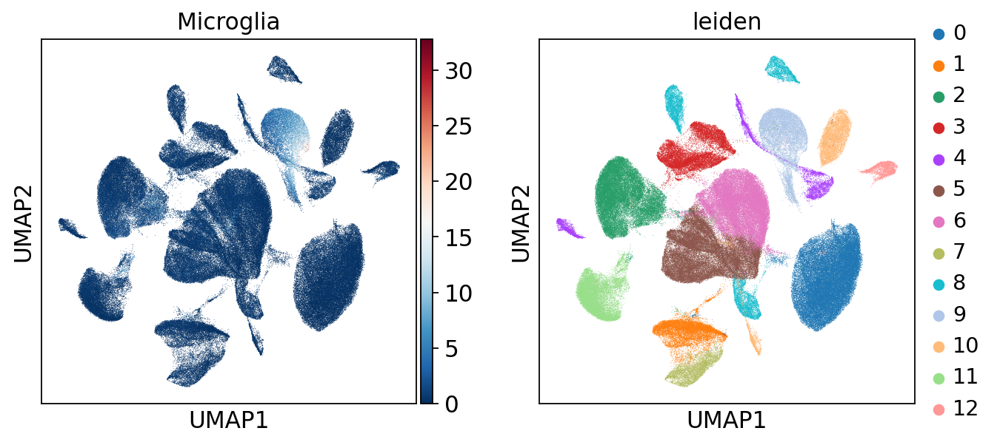

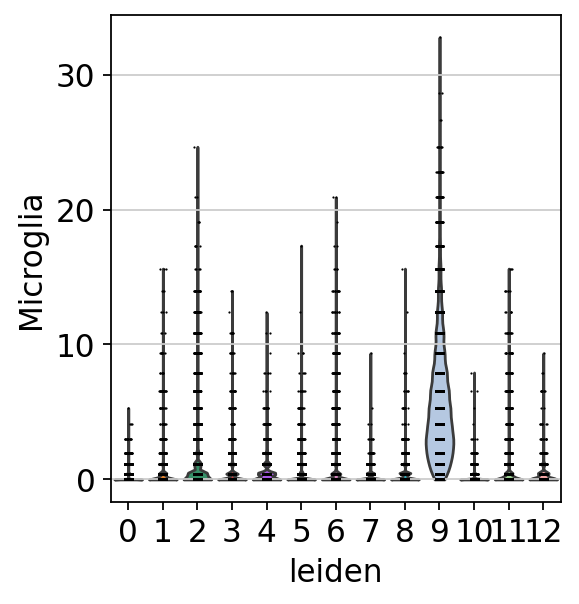

In [72]:
sc.pl.umap(acts, color=['Microglia', 'leiden'], cmap='RdBu_r')
sc.pl.violin(acts, keys=['Microglia'], groupby='leiden')

In [73]:
merged_adata_marker_df = dc.rank_sources_groups(acts, groupby='leiden', reference='rest', method='t-test_overestim_var')
merged_adata_marker_df

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,0,rest,Oligodendrocytes,350.534183,13.033362,0.000000e+00,0.000000e+00
1,0,rest,Schwann cells,259.702228,5.408621,0.000000e+00,0.000000e+00
2,0,rest,Oligodendrocyte progenitor cells,27.267539,0.419383,1.138719e-162,1.287247e-162
3,0,rest,Ependymal cells,10.664678,0.054610,1.552993e-26,1.615112e-26
4,0,rest,Choroid plexus cells,-5.484221,-0.018157,4.165354e-08,4.165354e-08
...,...,...,...,...,...,...,...
333,9,rest,Tanycytes,-70.842694,-0.595907,0.000000e+00,0.000000e+00
334,9,rest,Interneurons,-71.463295,-1.069893,0.000000e+00,0.000000e+00
335,9,rest,Neurons,-72.511163,-1.479365,0.000000e+00,0.000000e+00
336,9,rest,Immature neurons,-80.550012,-0.755554,0.000000e+00,0.000000e+00


In [74]:
n_ctypes = 3
ctypes_dict = merged_adata_marker_df.groupby('group').head(n_ctypes).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
ctypes_dict

{'0': ['Oligodendrocytes',
  'Schwann cells',
  'Oligodendrocyte progenitor cells'],
 '1': ['Cajal-Retzius cells', 'GABAergic neurons', 'Interneurons'],
 '10': ['Neurons', 'Adrenergic neurons', 'Neuroendocrine cells'],
 '11': ['Oligodendrocyte progenitor cells', 'Tanycytes', 'Neuroblasts'],
 '12': ['Pinealocytes', 'Purkinje neurons', 'Tanycytes'],
 '2': ['Astrocytes', 'Satellite glial cells', 'Bergmann glia'],
 '3': ['GABAergic neurons', 'Purkinje neurons', 'Interneurons'],
 '4': ['Meningeal cells', 'Retinal ganglion cells', 'Adrenergic neurons'],
 '5': ['Pyramidal cells', 'Neurons', 'Immature neurons'],
 '6': ['Immature neurons', 'Neurons', 'Pinealocytes'],
 '7': ['GABAergic neurons', 'Interneurons', 'Neuroblasts'],
 '8': ['Immature neurons', 'Neurons', 'Interneurons'],
 '9': ['Microglia', 'Neural stem/precursor cells', 'Satellite glial cells']}

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


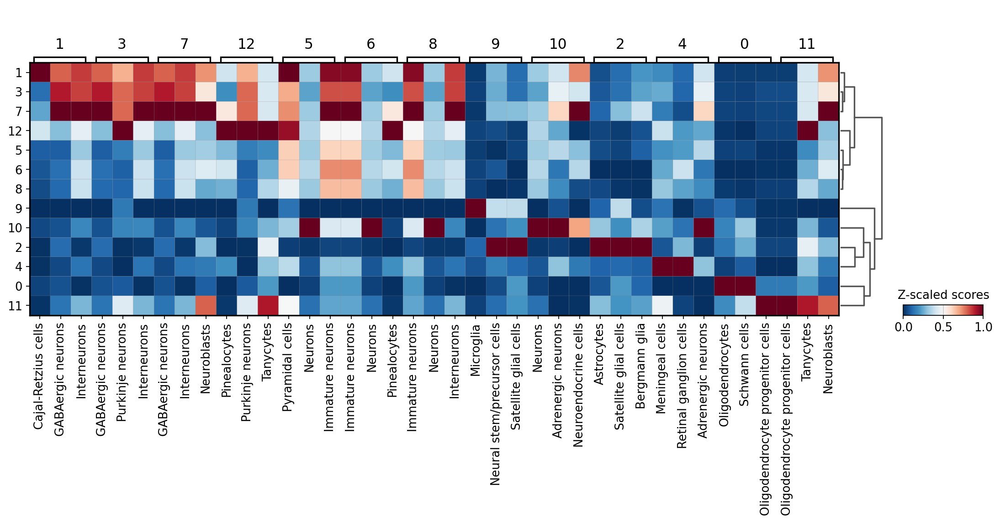

In [75]:
sc.pl.matrixplot(acts, ctypes_dict, 'leiden', dendrogram=True, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='RdBu_r')

In [76]:
annotation_dict = merged_adata_marker_df.groupby('group').head(1).set_index('group')['names'].to_dict()
annotation_dict

{'0': 'Oligodendrocytes',
 '1': 'Cajal-Retzius cells',
 '10': 'Neurons',
 '11': 'Oligodendrocyte progenitor cells',
 '12': 'Pinealocytes',
 '2': 'Astrocytes',
 '3': 'GABAergic neurons',
 '4': 'Meningeal cells',
 '5': 'Pyramidal cells',
 '6': 'Immature neurons',
 '7': 'GABAergic neurons',
 '8': 'Immature neurons',
 '9': 'Microglia'}

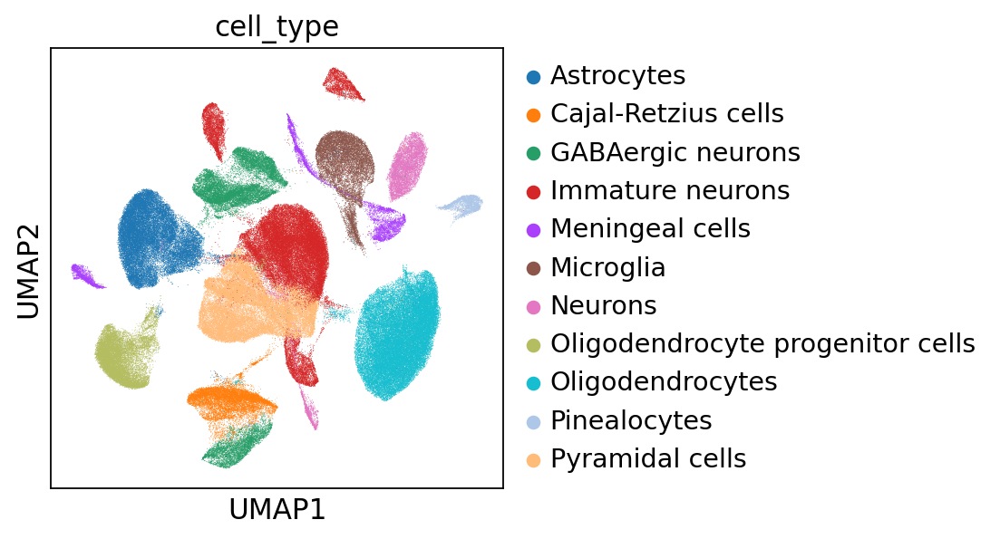

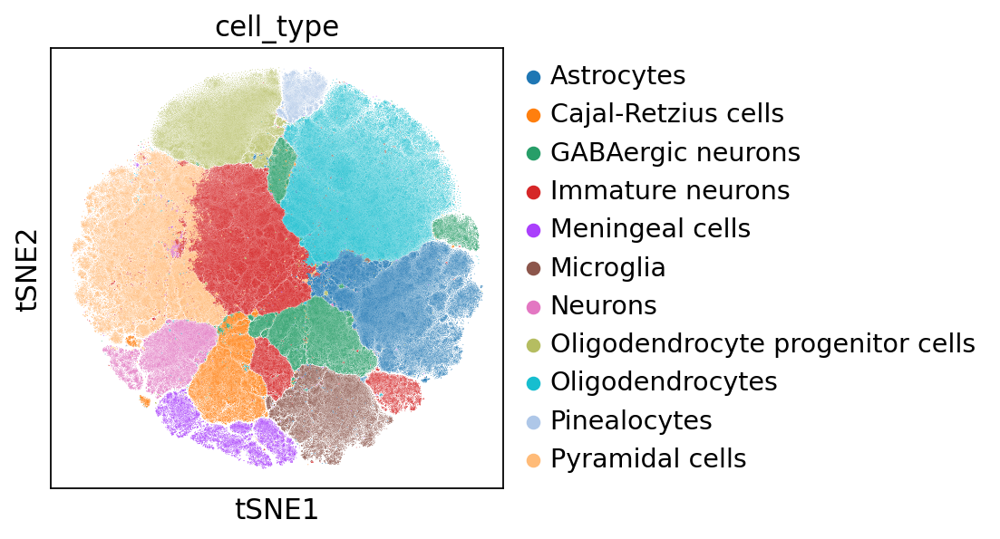

In [77]:
merged_adata.obs['cell_type'] = [annotation_dict[clust] for clust in merged_adata.obs['leiden']]

sc.pl.umap(merged_adata, color='cell_type')
sc.pl.tsne(merged_adata, color='cell_type')

In [78]:
merged_adata.write(results_file)

In [604]:
# Methods can be 't-test', 't-test_overestim_var' for overreestimates varience of each group
# 'wilcoxon' for rank-sum
# 'logreg' for logistic regression

#rsc.tl.rank_genes_groups_logreg(merged_adata, groupby="kmeans", use_raw=False)
#sc.pl.rank_genes_groups(merged_adata, n_genes=20, sharey=False, ncols=4)

In [605]:
#sc.settings.verbosity = 2  # reduce the verbosity
#merged_adata.write(results_file)

In [606]:
#sc.tl.rank_genes_groups(merged_adata, "leiden", method="wilcoxon")
#sc.pl.rank_genes_groups(merged_adata, n_genes=25, sharey=False, ncols=4)

In [607]:
#sc.tl.rank_genes_groups(merged_adata, "leiden", method="logreg", max_iter=1000)
#sc.pl.rank_genes_groups(merged_adata, n_genes=25, sharey=False, ncols=4)

In [608]:
#merged_adata = sc.read(results_file)

In [609]:
#pd.DataFrame(merged_adata.uns["rank_genes_groups"]["names"]).head(10)

In [610]:
#result = merged_adata.uns["rank_genes_groups"]
#groups = result["names"].dtype.names
#pd.DataFrame(
#    {
#        group + "_" + key[:1]: result[key][group]
#        for group in groups
#        for key in ["names"]#, "pvals"]
#    }
#).head(10)

In [611]:
#sc.tl.rank_genes_groups(merged_adata, "leiden", groups=["3"], reference="15", method="wilcoxon")
#sc.pl.rank_genes_groups(merged_adata, groups=["3"], n_genes=20)

In [612]:
#merged_adata = sc.read(results_file)

In [613]:
#sc.pl.rank_genes_groups_violin(merged_adata, groups="3", n_genes=8)

In [614]:
#sc.pl.violin(merged_adata, ["C3", "P2RY12"], groupby= "leiden", use_raw=False)

## **Pseudobulking pyDeseq2**

In [79]:
#import scipy.sparse as sp

#sparse_matrix_after = sp.csr_matrix(merged_adata.X)
#merged_adata.X = sparse_matrix_after

In [201]:
merged_adata = sc.read(results_file)

In [217]:
merged_adata.obs['cell_type']

GATCAGTTCCTGTACC-1    Immature neurons
TTTGTCAGTAATCACC-1    Immature neurons
CGACCTTTCCACTCCA-1    Immature neurons
CCAATCCAGTTTCCTT-1             Neurons
TCGAGGCAGTGAACAT-1     Pyramidal cells
                            ...       
AGATTGCTCTTGACGA-1     Pyramidal cells
AGCTTGATCTGGAGCC-1             Neurons
GATCTAGTCCATGAAC-1          Astrocytes
GGCCGATCAATGGATA-1           Microglia
TGGACGCCAAATCCGT-1          Astrocytes
Name: cell_type, Length: 213478, dtype: category
Categories (11, object): ['Astrocytes', 'Cajal-Retzius cells', 'GABAergic neurons', 'Immature neurons', ..., 'Oligodendrocyte progenitor cells', 'Oligodendrocytes', 'Pinealocytes', 'Pyramidal cells']

In [202]:
#Convert .X to sparse after moving back to CPU
merged_adata.X

array([[-0.07745935, -0.03103839,  1.57591582, ...,  0.16326288,
         0.32733905,  0.24564209],
       [-0.07553297, -0.03192338,  0.91077616, ...,  0.49313908,
        -0.28433828,  0.19836904],
       [-0.07239496, -0.033365  , -0.20195243, ...,  0.16614339,
         0.67085555,  1.39548856],
       ...,
       [-0.08014261, -0.02980568, -0.19198787, ..., -0.8994241 ,
        -0.1325563 , -0.64496916],
       [-0.07641663, -0.03151742, -0.19678   , ..., -1.13190167,
        -0.25524191, -0.86039146],
       [-0.07675909, -0.03136009, -0.19633954, ..., -1.11053425,
        -0.24396566, -0.84059161]])

In [218]:
merged_adata.layers['counts']

<213478x5000 sparse matrix of type '<class 'numpy.float64'>'
	with 86573389 stored elements in Compressed Sparse Row format>

In [204]:
import pydeseq2
from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats
import random

In [205]:
merged_adata

AnnData object with n_obs × n_vars = 213478 × 5000
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'leiden', 'louvain', 'kmeans', 'umap_density_Patient', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'kmeans_colors', 'leiden', 'leiden_colors', 'log1p', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'tsne', 'umap', 'umap_density_Patient_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [206]:
print(merged_adata.obs['Patient'])

GATCAGTTCCTGTACC-1      C36
TTTGTCAGTAATCACC-1      C36
CGACCTTTCCACTCCA-1      C36
CCAATCCAGTTTCCTT-1      C36
TCGAGGCAGTGAACAT-1      C36
                      ...  
AGATTGCTCTTGACGA-1    PD416
AGCTTGATCTGGAGCC-1    PD416
GATCTAGTCCATGAAC-1    PD416
GGCCGATCAATGGATA-1    PD416
TGGACGCCAAATCCGT-1    PD416
Name: Patient, Length: 213478, dtype: category
Categories (28, object): ['C05', 'C22', 'C34', 'C36', ..., 'PDD501', 'PDD531', 'PDD563', 'PDD678']


In [219]:
cluster_subset = merged_adata[merged_adata.obs['cell_type'] == 'Oligodendrocytes'].copy()
cluster_subset

AnnData object with n_obs × n_vars = 40630 × 5000
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'leiden', 'louvain', 'kmeans', 'umap_density_Patient', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'kmeans_colors', 'leiden', 'leiden_colors', 'log1p', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'tsne', 'umap', 'umap_density_Patient_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [220]:
cluster_subset.layers['counts'].max()

136.0

In [221]:
cluster_subset_PD_CTL = cluster_subset[cluster_subset.obs['Conditions'].isin(['PD', 'CTL'])].copy()
cluster_subset_PDD_CTL = cluster_subset[cluster_subset.obs['Conditions'].isin(['PDD', 'CTL'])].copy()
cluster_subset_DLB_CTL = cluster_subset[cluster_subset.obs['Conditions'].isin(['DLB', 'CTL'])].copy()
cluster_subset_PD_PDD = cluster_subset[cluster_subset.obs['Conditions'].isin(['PD', 'PDD'])].copy()
cluster_subset_PD_DLB = cluster_subset[cluster_subset.obs['Conditions'].isin(['PD', 'DLB'])].copy()
cluster_subset_PDD_DLB = cluster_subset[cluster_subset.obs['Conditions'].isin(['PDD', 'DLB'])].copy()

In [222]:
cluster_subset_PDD_CTL.obs['Conditions']

ACCTTTATCGTTGACA-1    CTL
TTTGGTTCAACTGCTA-1    CTL
GGATTACTCTCGTTTA-1    CTL
CAACTAGGTCATATCG-1    CTL
GTTTCTACACTCTGTC-1    CTL
                     ... 
GTTCTCGAGTGTCTCA-1    CTL
TTAACTCAGTGGGTTG-1    CTL
TACGGGCCAAGCTGTT-1    CTL
CTCGTCATCTAACTCT-1    CTL
CGTCACTCAGCTCGAC-1    CTL
Name: Conditions, Length: 24489, dtype: category
Categories (2, object): ['CTL', 'PDD']

In [223]:
cluster_subset_PDD_DLB

AnnData object with n_obs × n_vars = 19003 × 5000
    obs: 'Patient', 'Conditions', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'leiden', 'louvain', 'kmeans', 'umap_density_Patient', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'kmeans_colors', 'leiden', 'leiden_colors', 'log1p', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'tsne', 'umap', 'umap_density_Patient_params'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [224]:
pbs_pd_ctl = []
pbs_pdd_ctl = []
pbs_dlb_ctl = []
pbs_pd_pdd = []
pbs_pd_dlb = []
pbs_pdd_dlb = []

In [225]:
def process_subset(subset, pbs_list):
    
    for patient in subset.obs.Patient.unique():
    
        subset_patient = subset[subset.obs['Patient'] == patient, :].copy()
        subset_patient.X = subset_patient.layers['counts'] #change to raw counts using array

        rep_adata = sc.AnnData(X = subset_patient.X.sum(axis=0),
                               var=subset_patient.var[[]])
    
        rep_adata.obs_names = [patient]
        rep_adata.obs['Conditions'] = subset_patient.obs['Conditions'].iloc[0]
        rep_adata.obs['Patient'] = subset_patient.obs['Patient'].iloc[0]

        pbs_list.append(rep_adata)

In [226]:
process_subset(cluster_subset_PD_CTL, pbs_pd_ctl)
process_subset(cluster_subset_PDD_CTL, pbs_pdd_ctl)
process_subset(cluster_subset_DLB_CTL, pbs_dlb_ctl)
process_subset(cluster_subset_PD_PDD, pbs_pd_pdd)
process_subset(cluster_subset_PD_DLB, pbs_pd_dlb)
process_subset(cluster_subset_PDD_DLB, pbs_pdd_dlb)

In [227]:
pbs_dlb_ctl

[AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object 

In [228]:
pbs_pd_ctl

[AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object with n_obs × n_vars = 1 × 5000
     obs: 'Conditions', 'Patient',
 AnnData object 

In [229]:
pb_1 = sc.concat(pbs_pd_ctl)
pb_2 = sc.concat(pbs_pdd_ctl)
pb_3 = sc.concat(pbs_dlb_ctl)
pb_4 = sc.concat(pbs_pd_pdd)
pb_5 = sc.concat(pbs_pd_dlb)
pb_6 = sc.concat(pbs_pdd_dlb)

In [230]:
datasets = [pb_1, pb_2, pb_3, pb_4, pb_5, pb_6]
counts_data = []
dds_data = []

for i, pb, in enumerate(datasets, start=1):
    
    pb.var['gene'] = pb.var_names.values
    counts = pd.DataFrame(pb.X, columns=pb.var['gene']).set_index([pb.obs['Patient']])
    globals()[f'counts_{i}'] = counts
    counts_data.append(counts)

#Change index of counts to 1-6, instead of 0-5
counts_dict = {}
for i, counts in enumerate(counts_data, start=1):
    counts_dict[i] = counts

In [231]:
counts_dict[1]

gene,SAMD11,AL645608.8,HES4,ISG15,TNFRSF4,VWA1,GABRD,HES5,TTC34,LINC00982,...,MT-ND2,MT-CO1,MT-CO2,MT-ATP6,MT-CO3,MT-ND3,MT-ND4L,MT-ND4,MT-ND5,MT-CYB
Patient,,,,,,,,,,,,,,,,,,,,,
C36,1.0,0.0,2.0,0.0,1.0,377.0,2.0,0.0,0.0,2.0,...,279.0,670.0,672.0,262.0,927.0,479.0,5.0,408.0,11.0,163.0
C34,3.0,0.0,2.0,1.0,0.0,502.0,2.0,2.0,0.0,0.0,...,801.0,1343.0,1793.0,651.0,1543.0,1477.0,28.0,1029.0,137.0,595.0
PD666,0.0,0.0,1.0,0.0,0.0,145.0,0.0,4.0,3.0,2.0,...,204.0,241.0,282.0,159.0,365.0,235.0,11.0,161.0,16.0,94.0
PD732,0.0,0.0,0.0,7.0,0.0,172.0,0.0,0.0,0.0,0.0,...,314.0,56.0,302.0,68.0,222.0,124.0,5.0,116.0,10.0,107.0
PD523,2.0,0.0,0.0,10.0,2.0,424.0,2.0,0.0,2.0,0.0,...,3112.0,688.0,1893.0,1752.0,1466.0,4629.0,46.0,2168.0,84.0,1118.0
PD683,0.0,1.0,0.0,7.0,0.0,247.0,7.0,2.0,0.0,2.0,...,1523.0,1521.0,2829.0,1410.0,2485.0,2224.0,51.0,1904.0,133.0,770.0
PD413,0.0,0.0,0.0,1.0,0.0,151.0,0.0,0.0,0.0,2.0,...,373.0,294.0,493.0,187.0,357.0,244.0,6.0,228.0,10.0,148.0
C22,2.0,0.0,3.0,3.0,0.0,689.0,17.0,0.0,0.0,1.0,...,2923.0,1752.0,3074.0,1662.0,2820.0,3134.0,70.0,2214.0,230.0,1679.0
PD747,0.0,0.0,0.0,3.0,0.0,88.0,0.0,0.0,3.0,0.0,...,243.0,270.0,277.0,170.0,546.0,240.0,6.0,188.0,34.0,131.0


In [232]:
dds_data = []

for i, pb in enumerate(datasets, start=1):
    dds = DeseqDataSet(counts=counts_dict[i],
                       metadata = pb.obs,
                       design_factors=['Conditions'])
    
    globals()[f'dds_{i}'] = dds
    dds_data.append(dds)
    
    
dds_dict = {}
for i, dds in enumerate(dds_data, start=1):
    dds_dict[i] = dds

In [233]:
dds_dict

{1: AnnData object with n_obs × n_vars = 14 × 5000
     obs: 'Conditions', 'Patient'
     obsm: 'design_matrix',
 2: AnnData object with n_obs × n_vars = 14 × 5000
     obs: 'Conditions', 'Patient'
     obsm: 'design_matrix',
 3: AnnData object with n_obs × n_vars = 14 × 5000
     obs: 'Conditions', 'Patient'
     obsm: 'design_matrix',
 4: AnnData object with n_obs × n_vars = 14 × 5000
     obs: 'Conditions', 'Patient'
     obsm: 'design_matrix',
 5: AnnData object with n_obs × n_vars = 14 × 5000
     obs: 'Conditions', 'Patient'
     obsm: 'design_matrix',
 6: AnnData object with n_obs × n_vars = 14 × 5000
     obs: 'Conditions', 'Patient'
     obsm: 'design_matrix'}

In [234]:
def deseq2_analyse(dds):
    sc.pp.filter_genes(dds, min_cells=1)
    dds.deseq2()
    sc.tl.pca(dds)
    sc.pl.pca(dds, color='Conditions', size = 200)


filtered out 275 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 6.66 seconds.

Fitting dispersion trend curve...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 5.78 seconds.

Fitting LFCs...


computing PCA
    with n_comps=13


... done in 4.04 seconds.

Replacing 12 outlier genes.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.03 seconds.



    finished (0:00:00)


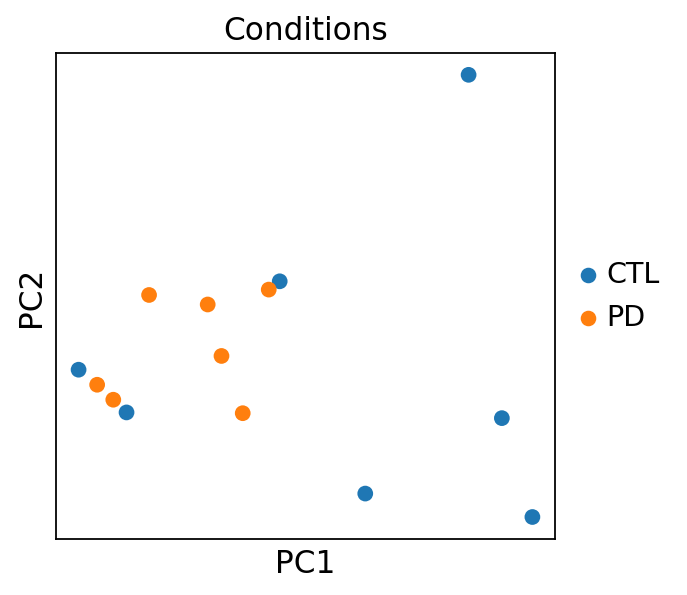

filtered out 235 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 5.52 seconds.

Fitting dispersion trend curve...
... done in 0.25 seconds.

Fitting MAP dispersions...
... done in 5.72 seconds.

Fitting LFCs...
... done in 3.93 seconds.

Replacing 19 outlier genes.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.05 seconds.

Fitting LFCs...


computing PCA
    with n_comps=13
    finished (0:00:00)


... done in 0.03 seconds.



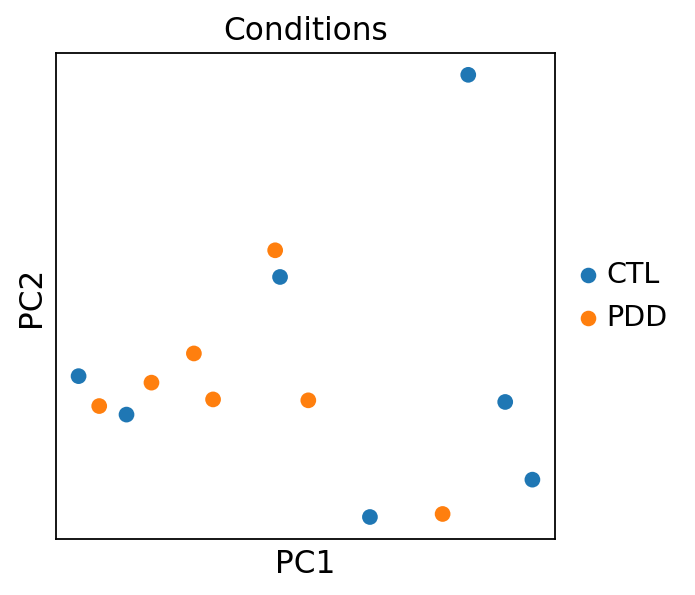

filtered out 264 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 5.40 seconds.

Fitting dispersion trend curve...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 5.81 seconds.

Fitting LFCs...


computing PCA
    with n_comps=13


... done in 3.83 seconds.

Replacing 10 outlier genes.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.03 seconds.



    finished (0:00:00)


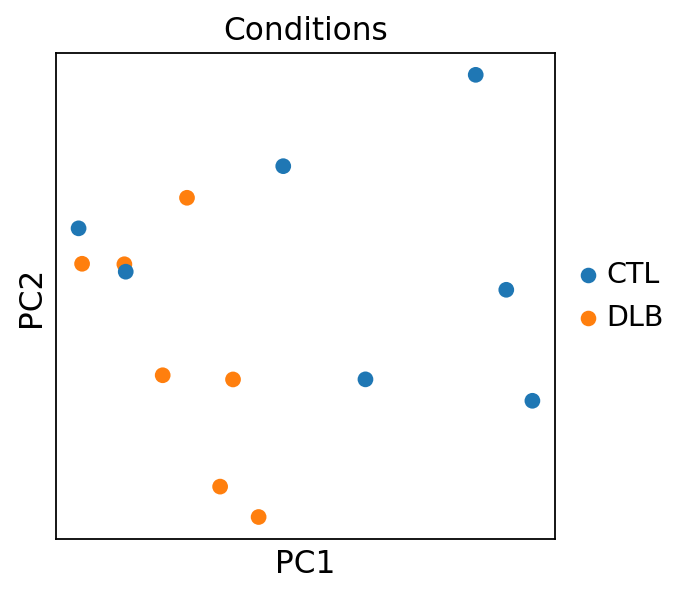

filtered out 275 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 5.22 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 5.67 seconds.

Fitting LFCs...
... done in 3.84 seconds.

Replacing 27 outlier genes.

Fitting dispersions...
... done in 0.05 seconds.

Fitting MAP dispersions...


computing PCA
    with n_comps=13
    finished (0:00:00)


... done in 0.05 seconds.

Fitting LFCs...
... done in 0.04 seconds.



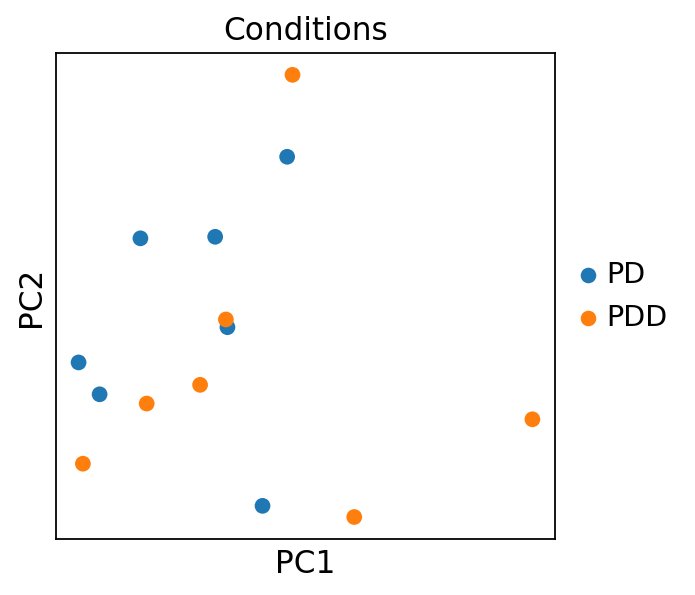

filtered out 300 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 5.24 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 5.59 seconds.

Fitting LFCs...
... done in 3.72 seconds.

Replacing 18 outlier genes.

Fitting dispersions...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting LFCs...


computing PCA
    with n_comps=13
    finished (0:00:00)


... done in 0.03 seconds.



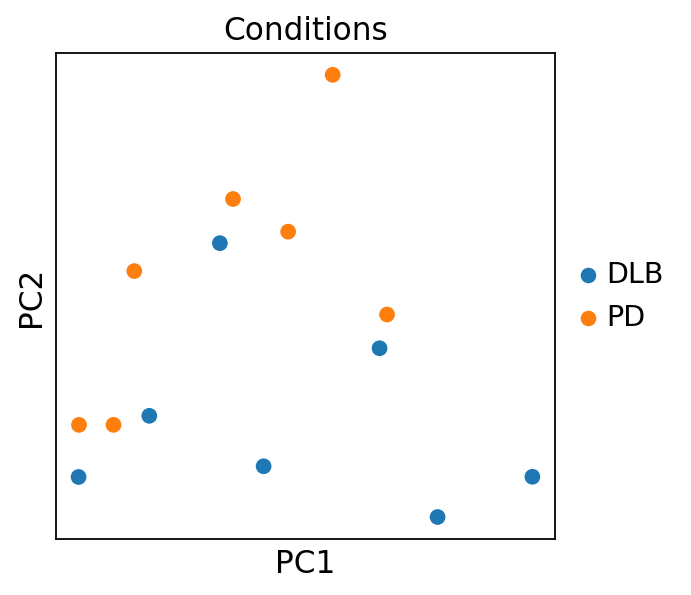

filtered out 262 genes that are detected in less than 1 cells


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 5.26 seconds.

Fitting dispersion trend curve...
... done in 0.24 seconds.

Fitting MAP dispersions...
... done in 6.36 seconds.

Fitting LFCs...
... done in 3.73 seconds.

Replacing 16 outlier genes.

Fitting dispersions...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting LFCs...


computing PCA
    with n_comps=13
    finished (0:00:00)


... done in 0.03 seconds.



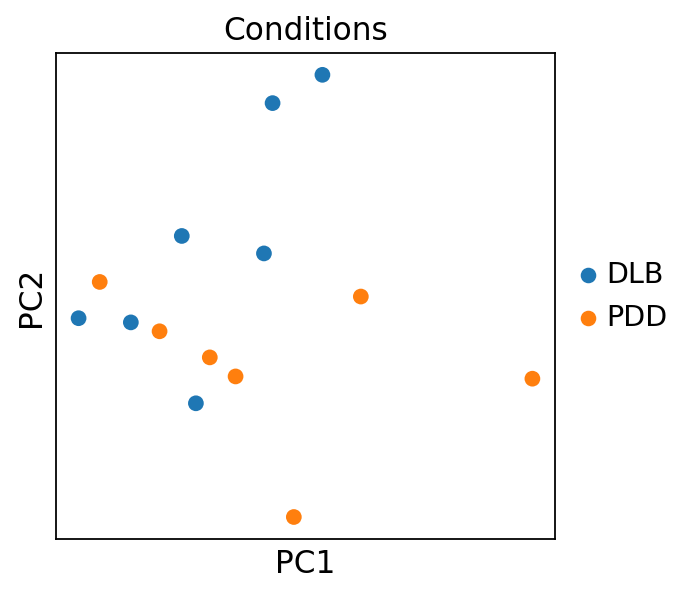

In [235]:
for i in range(1, 7):
    
    dds = dds_dict[i]
    deseq2_analyse(dds)

In [236]:
contrasts = [('Conditions', 'PD', 'CTL'), 
             ('Conditions', 'PDD', 'CTL'), 
             ('Conditions', 'DLB', 'CTL'),
             ('Conditions', 'PD', 'PDD'),
             ('Conditions', 'PD', 'DLB'),
             ('Conditions', 'PDD', 'DLB')]

start_res_data = []

for i, dds in dds_dict.items():
    contrast = contrasts[i-1]  # Adjusting index since keys start from 1
    start_res = DeseqStats(dds, contrast=contrast)
    
    globals()[f'start_res_{i}'] = start_res
    start_res_data.append(start_res)
    
    
start_res_dict = {}

for i, start_res in enumerate(start_res_data, start=1):
    start_res_dict[i] = start_res
    


In [237]:
for i in range(1,7):
    start_res_dict[i].summary()

Running Wald tests...
... done in 0.97 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: Conditions PD vs CTL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
gene                                                                          
SAMD11        1.194404       -2.232887  1.565596 -1.426221  0.153804  0.999701
AL645608.8    0.063368        1.095231  3.377391  0.324283  0.745724  0.999701
HES4          1.275837       -1.983669  1.203246 -1.648597  0.099230  0.999701
ISG15         4.333946        1.414981  0.883042  1.602394  0.109068  0.999701
TNFRSF4       0.592419        0.725700  1.971986  0.368005  0.712870  0.999701
...                ...             ...       ...       ...       ...       ...
MT-ND3      936.399926        0.296664  0.541797  0.547555  0.583998  0.999701
MT-ND4L      22.401357        0.529867  0.561733  0.943273  0.345541  0.999701
MT-ND4      663.468046        0.278183  0.477133  0.583031  0.559873  0.999701
MT-ND5       59.622790       -0.031782  0.555469 -0.057216  0.954373  0.

... done in 1.02 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: Conditions PDD vs CTL
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
gene                                                                    
SAMD11         1.488858       -2.124672  1.391238 -1.527181  0.126716   
AL645608.8     0.235731        1.699741  3.132343  0.542642  0.587376   
HES4           1.848076       -1.205604  0.922875 -1.306357  0.191431   
ISG15          7.129987        2.049404  0.997552  2.054433  0.039934   
TNFRSF4        0.690123        0.524608  1.767877  0.296744  0.766662   
...                 ...             ...       ...       ...       ...   
MT-ND3      1696.758055        1.283169  0.543275  2.361913  0.018181   
MT-ND4L       29.715756        0.755207  0.655848  1.151496  0.249528   
MT-ND4      1085.694952        1.049245  0.542911  1.932629  0.053282   
MT-ND5        64.857895       -0.286834  0.566479 -0.506345  0.612615   
MT-CYB       562.847331        0.738610  0.484822  1.523465  0.1

... done in 0.97 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: Conditions DLB vs CTL
               baseMean  log2FoldChange     lfcSE      stat        pvalue  \
gene                                                                        
SAMD11         1.803383       -0.588522  1.273336 -0.462189  6.439461e-01   
AL645608.8     0.111063        0.823220  3.370803  0.244221  8.070599e-01   
HES4           1.651713       -1.281593  1.033841 -1.239642  2.151080e-01   
ISG15          4.413373        1.313027  0.967063  1.357747  1.745439e-01   
TNFRSF4        0.325918       -1.335383  2.813394 -0.474652  6.350351e-01   
...                 ...             ...       ...       ...           ...   
MT-ND3      2271.374128        1.986467  0.382221  5.197162  2.023541e-07   
MT-ND4L       27.906532        0.860439  0.451315  1.906517  5.658320e-02   
MT-ND4      1195.752933        1.406073  0.333543  4.215569  2.491487e-05   
MT-ND5        72.116560        0.261535  0.450034  0.581146  5.611419e-01   
MT-CYB       758

... done in 0.99 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: Conditions PD vs PDD
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
gene                                                                    
SAMD11         0.247890       -0.126374  2.699295 -0.046818  0.962659   
AL645608.8     0.238970       -0.591359  2.746828 -0.215288  0.829543   
HES4           0.650512       -0.821011  1.425967 -0.575758  0.564779   
ISG15          7.117342       -0.741159  0.885430 -0.837060  0.402559   
TNFRSF4        0.528690        0.252026  1.775895  0.141915  0.887147   
...                 ...             ...       ...       ...       ...   
MT-ND3      1428.887471       -1.008456  0.628605 -1.604277  0.108653   
MT-ND4L       26.647535       -0.271002  0.650806 -0.416410  0.677110   
MT-ND4       917.699594       -0.797857  0.612263 -1.303129  0.192531   
MT-ND5        50.183246        0.228997  0.582536  0.393103  0.694243   
MT-CYB       456.049485       -0.662537  0.513152 -1.291113  0.19

... done in 1.04 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: Conditions PD vs DLB
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
gene                                                                    
SAMD11         0.560639       -1.599749  2.147845 -0.744816  0.456383   
AL645608.8     0.144255        0.267840  3.300746  0.081145  0.935326   
HES4           0.562519       -0.735128  1.735996 -0.423462  0.671958   
ISG15          4.767060        0.052742  0.828729  0.063643  0.949255   
TNFRSF4        0.242285        1.917818  2.983189  0.642875  0.520305   
...                 ...             ...       ...       ...       ...   
MT-ND3      1841.499572       -1.669721  0.502352 -3.323807  0.000888   
MT-ND4L       24.651566       -0.263432  0.431767 -0.610125  0.541779   
MT-ND4       984.989475       -1.111982  0.447972 -2.482261  0.013055   
MT-ND5        55.399888       -0.269159  0.461938 -0.582673  0.560114   
MT-CYB       599.095436       -1.407984  0.390788 -3.602932  0.00

... done in 1.01 seconds.



In [238]:
from sanbomics.tools import id_map

In [239]:
de_data = []
sigs_data = []

for i, start_res in start_res_dict.items():
    de = start_res_dict[i].results_df
    de['gene_symbol'] = de.index
    sigs = de[(de.padj < 0.01) & (abs(de.log2FoldChange) > 0.5)]
    
    globals()[f'de_{i}'] = de
    globals()[f'sigs_{i}'] = sigs
    
    de_data.append(de)
    sigs_data.append(sigs)
    
    
de_data_dict = {}
sigs_data_dict = {}

for i, de in enumerate(de_data, start=1):
    de_data_dict[i] = de

for i, sigs in enumerate(sigs_data, start=1):
    sigs_data_dict[i] = sigs

In [240]:
de_data_dict[1].sort_values('padj')

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,gene_symbol
gene,,,,,,,
TTTY15,6.766157,-4.076845,0.809138,-5.038502,4.691905e-07,0.002217,TTTY15
FAP,5.476321,2.717771,0.752780,3.610311,3.058305e-04,0.722525,FAP
LOXL4,0.044490,1.095231,3.377391,0.324283,7.457236e-01,0.999701,LOXL4
CRTAC1,1.821287,0.275692,0.981195,0.280976,7.787291e-01,0.999701,CRTAC1
PGAM1,27.617924,-0.081611,0.695213,-0.117390,9.065509e-01,0.999701,PGAM1
...,...,...,...,...,...,...,...
RELL2,2.110779,-0.204249,0.937110,-0.217956,8.274634e-01,0.999701,RELL2
KCTD16,10.531393,-0.215077,0.600285,-0.358291,7.201255e-01,0.999701,KCTD16
MT-CYB,370.014923,0.106618,0.422299,0.252470,8.006780e-01,0.999701,MT-CYB


In [241]:
sigs_data_dict[6]

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,gene_symbol
gene,,,,,,,


In [242]:
dds_sigs_data = []

for i, dds in dds_dict.items():    
    dds_dict[i].layers['log1p'] = np.log1p(dds_dict[i].layers['normed_counts'])
    dds_sigs = dds_dict[i][:, sigs_data_dict[i].index]
    
    
    globals()[f'dds_sigs_{i}'] = dds_sigs
    dds_sigs_data.append(dds_sigs)

dds_sigs_data_dict = {}

for i, dds_sigs in enumerate(dds_sigs_data, start=1):
    dds_sigs_data_dict[i] = dds_sigs

In [243]:
dds_sigs_data_dict[2].obs['Patient']

C36          C36
C34          C34
PDD531    PDD531
PDD341    PDD341
PDD366    PDD366
PDD415    PDD415
PDD678    PDD678
PDD501    PDD501
PDD563    PDD563
C22          C22
C87          C87
C05          C05
C91          C91
C48          C48
Name: Patient, dtype: object

In [244]:
heat_map_data = []
ax_cluster_map = []

for i in range(1,7):
    heat_map = pd.DataFrame(dds_sigs_data_dict[i].layers['log1p'],
                            index=dds_sigs_data_dict[i].obs, 
                            columns=dds_sigs_data_dict[i].var_names)
    heat_map.set_index([dds_sigs_data_dict[i].obs['Conditions'], 
                        dds_sigs_data_dict[i].obs['Patient']], 
                       inplace=True)
    heat_map = heat_map.reindex(sorted(heat_map.columns), axis=1)
    heat_map = heat_map.T


    globals()[f'heat_map_{i}'] = heat_map
    
    
    heat_map_data.append(heat_map)
    

heat_map_data_dict = {}

for i, heat_map in enumerate(heat_map_data, start=1):
    heat_map_data_dict[i] = heat_map

In [245]:
heat_map_data_dict[2]

Conditions       CTL                 PDD                                \
Patient          C36       C34    PDD531    PDD341    PDD366    PDD415   
gene                                                                     
CCK         3.505537  2.570161  1.796139  0.900173  1.230761  1.033132   
RAB3A       3.128931  1.613956  2.335500  1.366106  0.000000  1.312319   
SNAP25      4.985981  3.091366  3.461855  2.747289  3.798384  3.686673   
SNCG        3.042119  2.041792  2.633676  0.679734  0.000000  0.644443   
SPARCL1     4.183555  3.224295  2.633676  2.715595  3.015077  2.796290   
STMN2       3.638881  2.423039  2.903241  2.173253  2.112816  0.000000   
VSNL1       3.351637  3.241921  2.335500  1.233545  1.230761  2.796290   

Conditions                                     CTL                      \
Patient       PDD678    PDD501    PDD563       C22       C87       C05   
gene                                                                     
CCK         1.871724  2.267933  2.163455  3.871655  3.978277  4.167155   
RAB3A       1.163088  1.357501  1.163254  3.309351  2.382289  3.619094   
SNAP25      3.349815  3.120095  2.727993  4.971636  4.377483  5.732554   
SNCG        0.000000  1.357501  0.000000  3.775682  3.028167  3.111390   
SPARCL1     2.727767  2.736466  2.653381  5.070188  4.692506  5.498807   
STMN2       1.458544  1.357501  1.163254  4.267078  1.453148  4.890452   
VSNL1       2.282300  2.267933  0.000000  4.467440  2.646616  4.944777   

Conditions                      
Patient          C91       C48  
gene                            
CCK         1.656261  4.982318  
RAB3A       1.963468  4.494197  
SNAP25      3.360149  5.854932  
SNCG        2.297617  4.678400  
SPARCL1     2.583845  5.204089  
STMN2       2.547639  5.022866  
VSNL1       2.471040  4.849766

In [246]:
cluster_pd_ctl = []
cluster_pdd_ctl = []
cluster_dlb_ctl = []
cluster_pd_pdd = []
cluster_pd_dlb = []
cluster_pdd_dlb = []

def cluster_heat_map(heat_map_value, cluster_list):
    cluster_heat_map = sns.clustermap(heat_map_value, z_score=0, cmap='RdYlBu_r')
    cluster_list.append(cluster_heat_map)
        

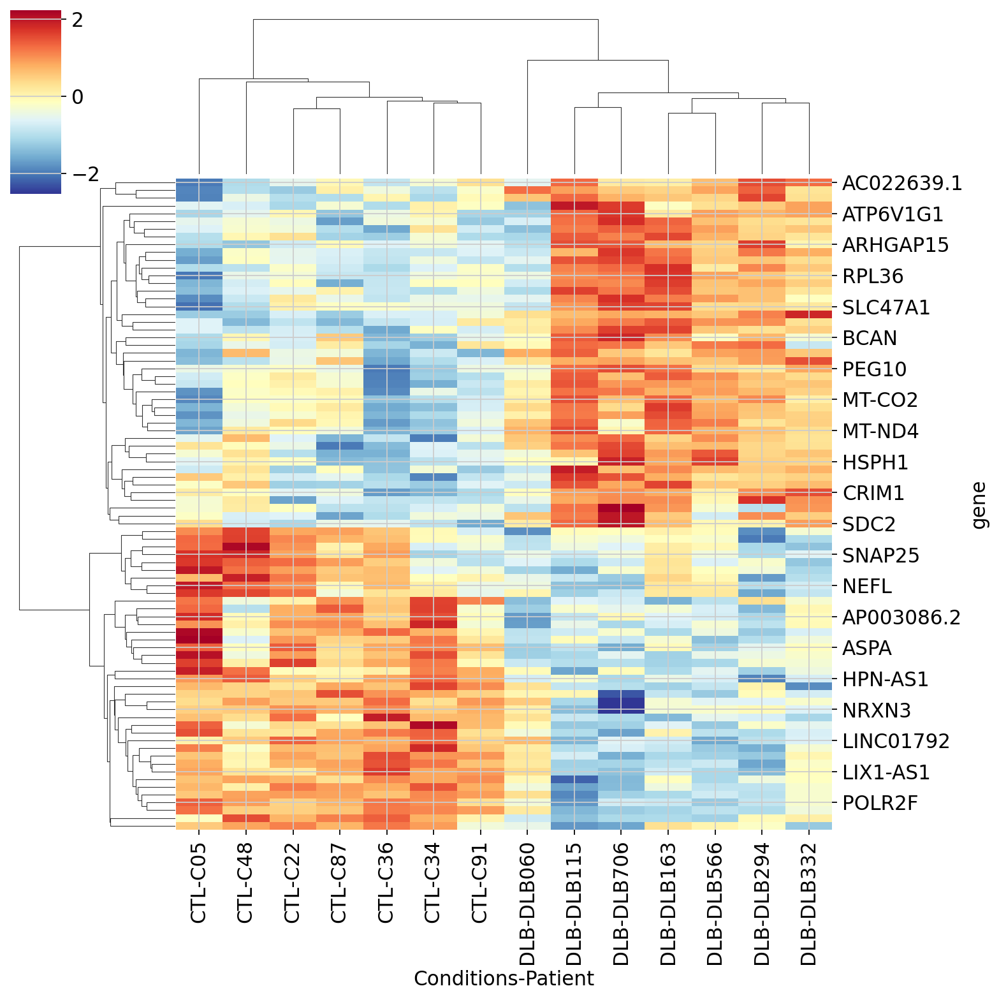

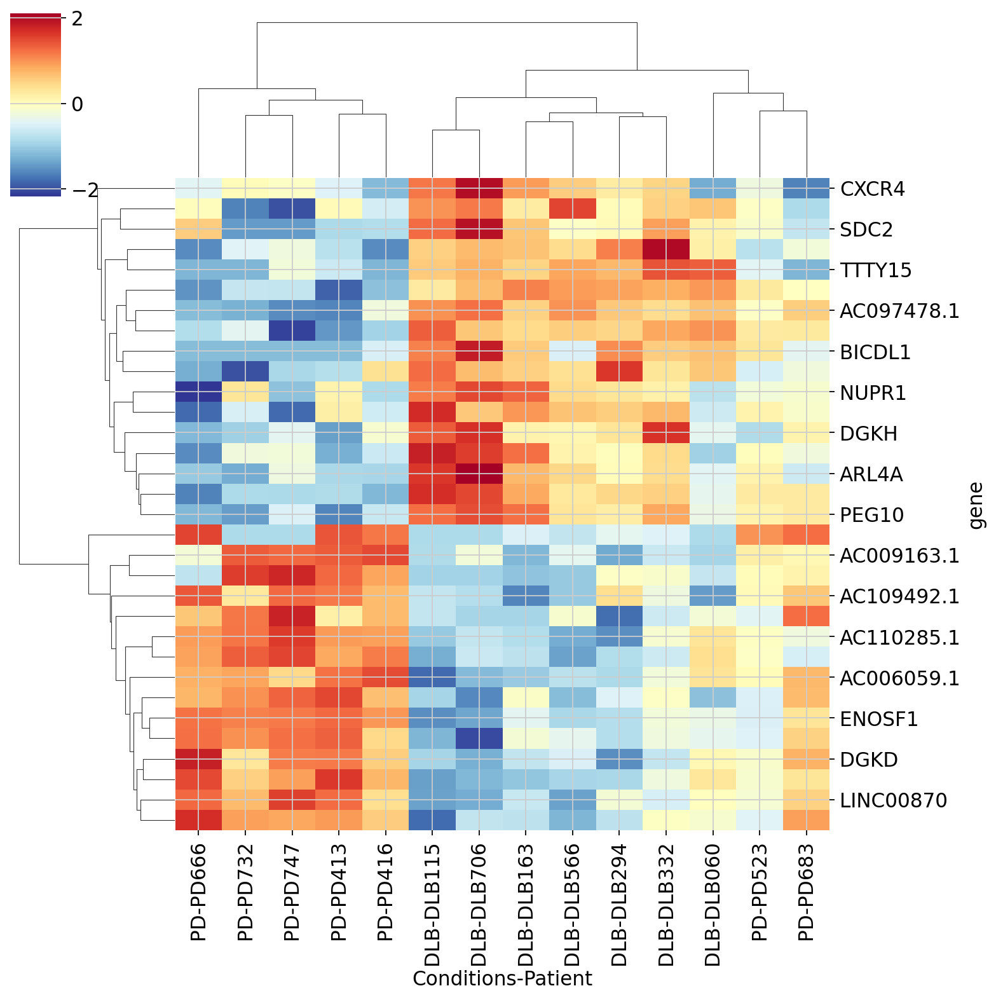

In [247]:
#cluster_heat_map(heat_map_data_dict[1], cluster_pd_ctl)
#cluster_heat_map(heat_map_data_dict[2], cluster_pdd_ctl)
cluster_heat_map(heat_map_data_dict[3], cluster_dlb_ctl)
#cluster_heat_map(heat_map_data_dict[4], cluster_pd_pdd)
cluster_heat_map(heat_map_data_dict[5], cluster_pd_dlb)
#cluster_heat_map(heat_map_data_dict[6], cluster_pdd_dlb)

In [248]:
import sanbomics
from sanbomics.plots import volcano

In [249]:
volcano_pd_ctl = []
volcano_pdd_ctl = []
volcano_dlb_ctl = []
volcano_pd_pdd = []
volcano_pd_dlb = []
volcano_pdd_dlb = []

def volcano_pseudobulk(de_value, plot_list):
    
    plot = volcano(de_value, 
                    symbol='gene_symbol', 
                    top_right_frame = True,
                    to_label = 10,
                    log2fc_thresh=0.75,
                    pval_thresh=0.05,
                    baseMean='baseMean',
                    figsize=(10,10))
    
    plot_list.append(plot)

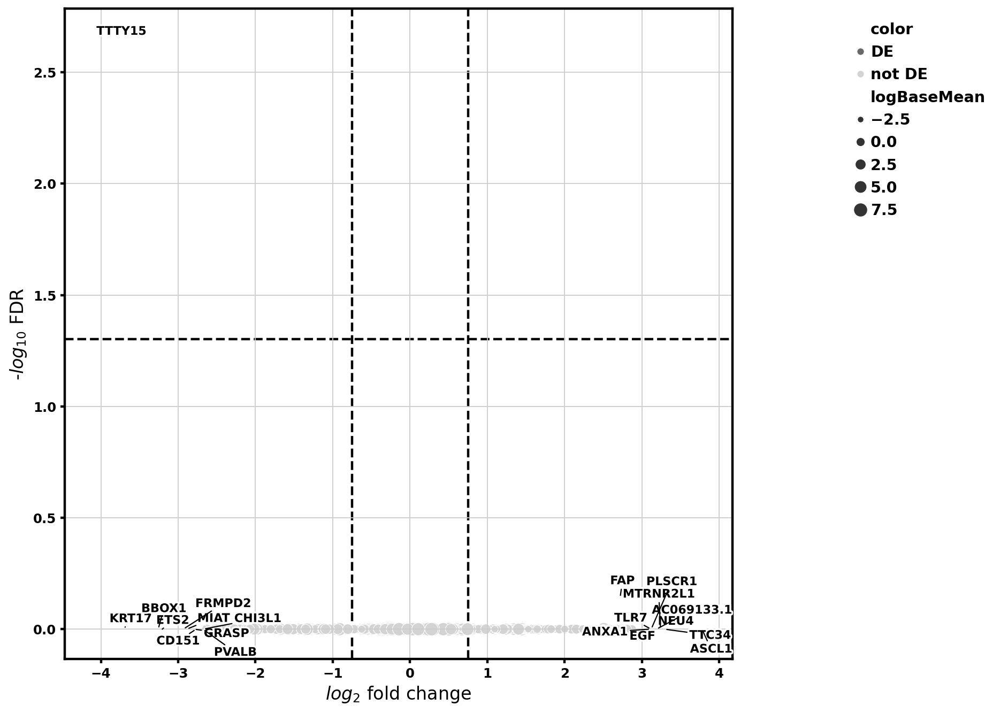

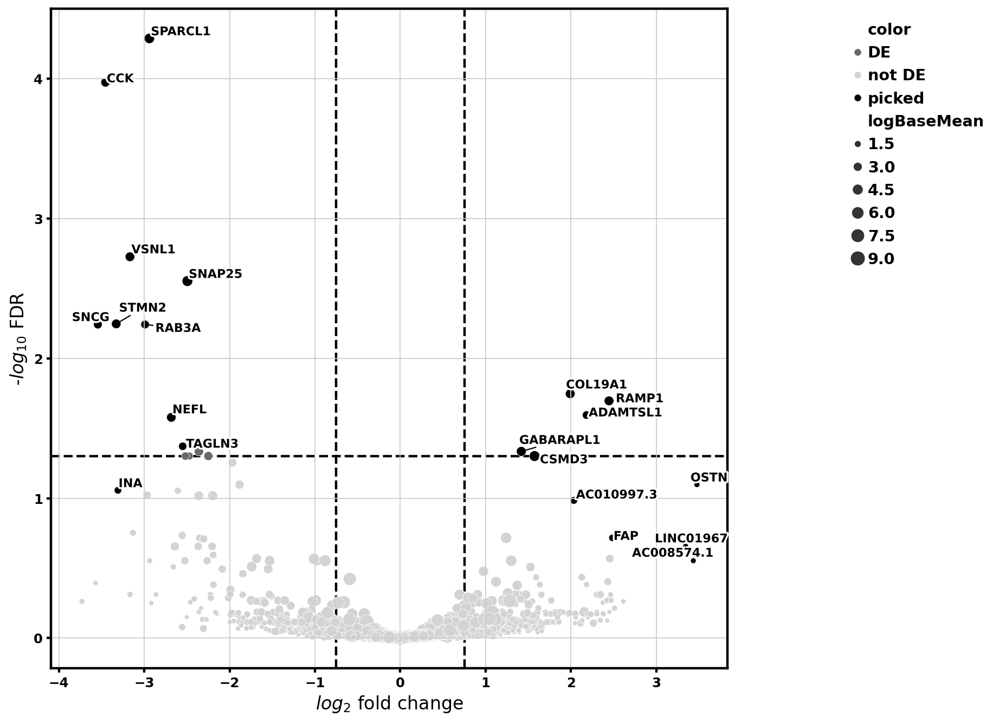

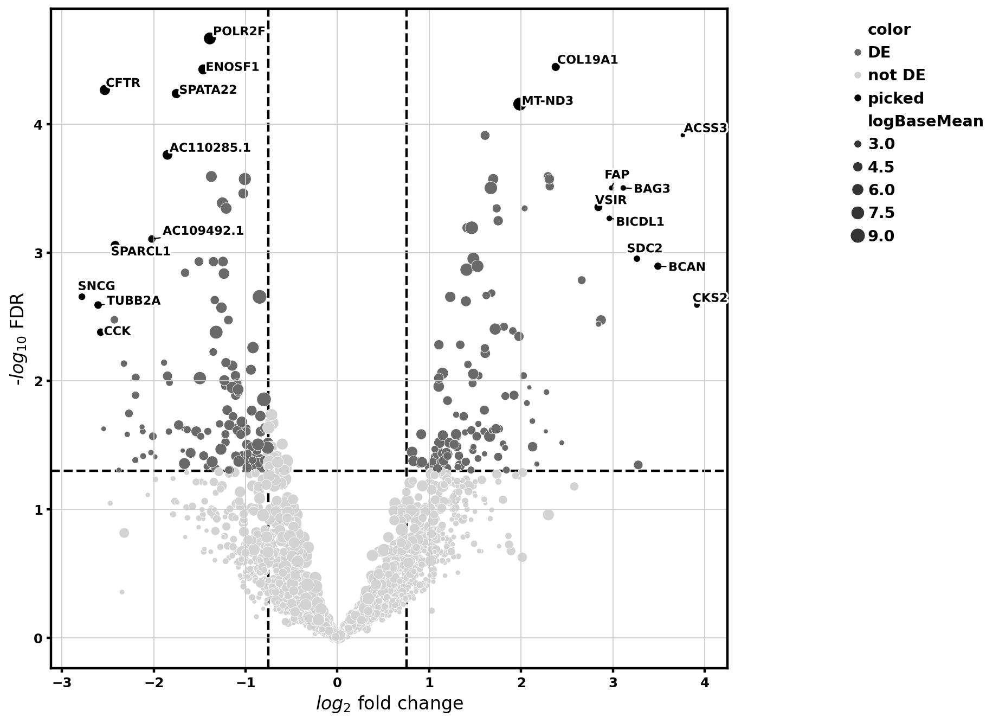

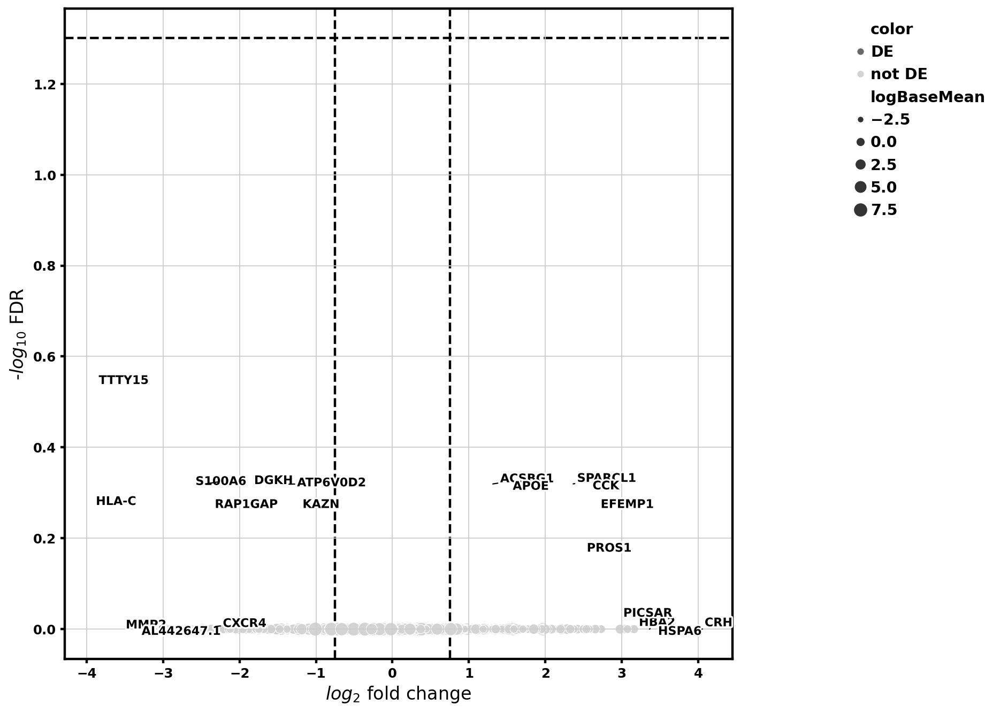

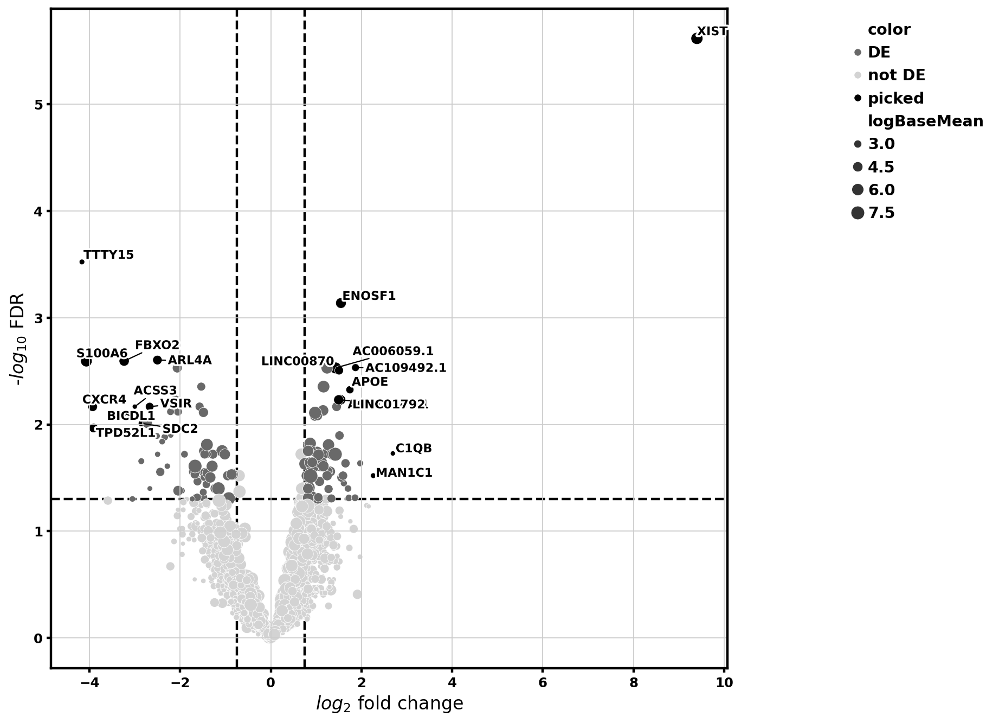

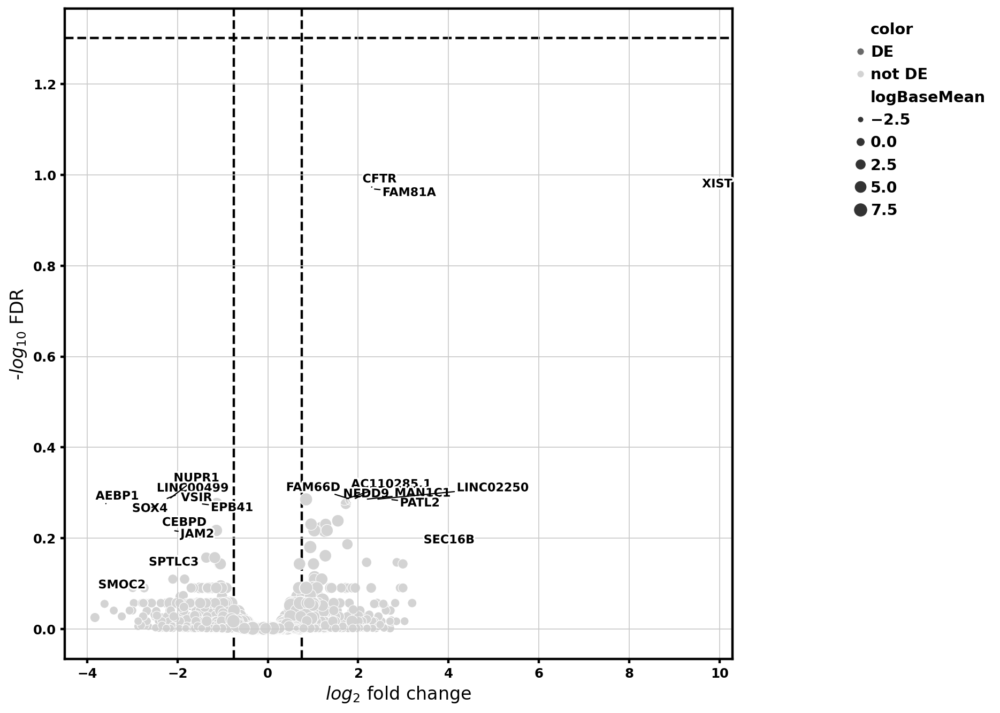

In [250]:
volcano_pseudobulk(de_data_dict[1], volcano_pd_ctl)
volcano_pseudobulk(de_data_dict[2], volcano_pdd_ctl)
volcano_pseudobulk(de_data_dict[3], volcano_dlb_ctl)
volcano_pseudobulk(de_data_dict[4], volcano_pd_pdd)
volcano_pseudobulk(de_data_dict[5], volcano_pd_dlb)
volcano_pseudobulk(de_data_dict[6], volcano_pdd_dlb)